In [1]:
import numpy as np
import matplotlib.pyplot as plt
import astropy.io.fits as fits
from scipy.optimize import leastsq
from scipy import ndimage
from allfunc import *
import random
from astropy.table import Table, hstack
import os
import glob
from astropy.table import Table, vstack, join
import pandas as pd

In [2]:
def popt_central_fit(wo_wave,central_data,central_error,obj,p_init,z,broad2=False,MC_loops=100):
    k = 1+z
    select = (wo_wave>4750*k) & (wo_wave < 5090*k)
    if broad2:
        full_gauss = full_gauss2
    else:
        full_gauss = full_gauss1
    popt_full_fit,pcov_full_fit = leastsq(full_gauss,x0=p_init,args=(wo_wave[select],central_data[select],central_error[select]),maxfev = 10000000)
    parameters_MC = np.zeros((len(popt_full_fit),MC_loops))
    for l in range(MC_loops):
        iteration_data = np.random.normal(central_data[select],central_error[select]) 
        popt_MC,pcov_MC =leastsq(full_gauss,x0=p_init,args=(wo_wave[select],iteration_data,central_error[select]),maxfev = 10000000)
        parameters_MC[:,l]=popt_MC
        parameters_err = np.std(parameters_MC,1)  
    (amp_Hb_error,amp_OIII5007_error,vel_OIII_error,vel_sigma_OIII_error,amp_Hb_br_error,amp_OIII5007_br_error,vel_OIII_br_error,vel_sigma_OIII_br_error,amp_Hb1_error,amp_Fe5018_1_error,vel_Hb1_error,vel_sigma_Hb1_error,amp_Hb2_error,amp_Fe5018_2_error,vel_Hb2_error,vel_sigma_Hb2_error,m_error,c_error) = parameters_err
    return popt_full_fit,parameters_err 

def popt_arb_fit(wave,data,error,p_init,broad2=False,MC_loops=100):
    if broad2:
        full_gauss = full_gauss2
    else:
        full_gauss = full_gauss1
    popt2,pcov2 = leastsq(full_gauss,x0=p_init,args=(wave,data,error),maxfev = 10000000)
    parameters_MC = np.zeros((len(popt2),MC_loops))
    for l in range(MC_loops):
        iteration_data = np.random.normal(data,error) 
        popt_MC,pcov_MC =leastsq(full_gauss,x0=p_init,args=(wave,iteration_data,error),maxfev = 10000000)
        parameters_MC[:,l]=popt_MC
        parameters_err = np.std(parameters_MC,1)  
    (amp_Hb_error,amp_OIII5007_error,vel_OIII_error,vel_sigma_OIII_error,amp_Hb_br_error,amp_OIII5007_br_error,vel_OIII_br_error,vel_sigma_OIII_br_error,amp_Hb1_error,amp_Fe5018_1_error,vel_Hb1_error,vel_sigma_Hb1_error,amp_Hb2_error,amp_Fe5018_2_error,vel_Hb2_error,vel_sigma_Hb2_error,m_error,c_error) = parameters_err
    return popt2,parameters_err

def arb_plot(obj,wave,data,error,popt,arb_fit,arb_residual):
    (amp_Hb_fit,amp_OIII5007_fit,vel_OIII_fit,vel_sigma_OIII_fit,amp_Hb_br_fit,amp_OIII5007_br_fit,vel_OIII_br_fit,vel_sigma_OIII_br_fit,amp_Hb1_fit,amp_Fe5018_1_fit,vel_Hb1_fit,vel_sigma_Hb1_fit,amp_Hb2_fit,amp_Fe5018_2_fit,vel_Hb2_fit,vel_sigma_Hb2_fit,m_fit,c_fit) = popt
    plt.plot(wave,data,'k-',label='data')
    plt.plot(wave,arb_fit,'r-',label='fit')
    plt.plot(wave,arb_residual,label='residual')
    plt.plot(wave,Hb_O3_gauss(wave,amp_Hb_fit,amp_OIII5007_fit,vel_OIII_fit,vel_sigma_OIII_fit) + continuum(wave,m_fit,c_fit),'-g',label='core')
    plt.plot(wave,Hb_O3_gauss(wave,amp_Hb_br_fit,amp_OIII5007_br_fit,vel_OIII_br_fit,vel_sigma_OIII_br_fit) + continuum(wave,m_fit,c_fit),color ='purple',label='wing')
    plt.plot(wave,Hb_Fe_doublet_gauss(wave,amp_Hb1_fit,amp_Fe5018_1_fit,vel_Hb1_fit,vel_sigma_Hb1_fit) + continuum(wave,m_fit,c_fit),color ='brown',label='BLR1')
    plt.plot(wave,Hb_Fe_doublet_gauss(wave,amp_Hb2_fit,amp_Fe5018_2_fit,vel_Hb2_fit,vel_sigma_Hb2_fit) + continuum(wave,m_fit,c_fit),'-c',label='BLR2')
    plt.title('%s_brightest_pixel_fit'%(obj))
    plt.xlabel(r"Wavelength ($\AA$)")
    plt.ylabel(r"Flux Density ($\times 10^{-16}$ erg s$^{-1}$ cm$^{-2}$ Hz$^{-1}$) ")
    plt.legend()
    plt.show() 
    


In [3]:
def arb_spectroastrometry(arb_data,arb_error,wave,fixed_param,broad2=False,MC_loops=100):
    output_par = np.zeros((10,arb_data.shape[1],arb_data.shape[2]),dtype=np.float32)
    output_par_err = np.zeros((10,arb_data.shape[1],arb_data.shape[2]),dtype=np.float32)
    if broad2:
        full_gauss_fixkin = full_gauss2_fixkin
    else:
        full_gauss_fixkin = full_gauss1_fixkin
    for i in range(arb_data.shape[1]):
        for j in range(arb_data.shape[2]):
            (spectrum,error) = (arb_data[:,i,j],arb_error[:,i,j])    
            popt1,pcov1 = leastsq(full_gauss_fixkin,x0=[0.1, 0.1, 0.1, 0.1, 0.01, 0.01, 0.01, 0.01, -0.7, 0.001],args=(wave,spectrum,error,fixed_param),maxfev = 10000000)
            
            output_par[:,i,j]=popt1
        
            spec_parameters_MC = np.zeros((len(popt1),MC_loops))
            for l in range(MC_loops):
                iteration_data = np.random.normal(spectrum,error)   
                popt_spec_MC,pcov_spec_MC = leastsq(full_gauss_fixkin,x0=[0.1, 0.1, 0.1, 0.1, 0.01, 0.01, 0.01, 0.01, -0.7, 0.001],args=(wave,iteration_data,error,fixed_param),maxfev = 10000000)
                spec_parameters_MC[:,l]=popt_spec_MC
                
            spec_parameters_err = np.std(spec_parameters_MC,1)
            output_par_err[:,i,j] = spec_parameters_err
    return output_par,output_par_err

def flux_map(spec_par,obj,x1,y1,destination_path_cube="/home/mainak/Downloads/Outflow_paper1/MUSE"):
    hdus=[]
    hdus.append(fits.PrimaryHDU())
    hdus.append(fits.ImageHDU(spec_par[0,:,:],name='amp_Hb'))
    hdus.append(fits.ImageHDU(spec_par[1,:,:],name='amp_OIII5007'))
    hdus.append(fits.ImageHDU(spec_par[2,:,:],name='amp_OIII5007_br'))
    hdus.append(fits.ImageHDU(spec_par[3,:,:],name='amp_Hb_br'))
    hdus.append(fits.ImageHDU(spec_par[4,:,:],name='amp_Hb1'))
    hdus.append(fits.ImageHDU(spec_par[5,:,:],name='amp_Hb2'))
    hdus.append(fits.ImageHDU(spec_par[6,:,:],name='amp_Fe5018_1'))
    hdus.append(fits.ImageHDU(spec_par[7,:,:],name='amp_Fe5018_2'))
    hdus.append(fits.ImageHDU(spec_par[8,:,:],name='m'))
    hdus.append(fits.ImageHDU(spec_par[9,:,:],name='c'))
    hdu = fits.HDUList(hdus)
    hdu.writeto('%s/%s/Systematic Error/x%sy%s_artificial_fluxmap_%s.fits'%(destination_path_cube,obj,x1,y1,obj),overwrite='True')

def flux_map_err(spec_err,obj,x1,y1,destination_path_cube="/home/mainak/Downloads/Outflow_paper1/MUSE"):
    hdus=[]
    hdus.append(fits.PrimaryHDU())
    hdus.append(fits.ImageHDU(spec_err[0,:,:],name='amp_Hb_err'))
    hdus.append(fits.ImageHDU(spec_err[1,:,:],name='amp_OIII5007_err'))
    hdus.append(fits.ImageHDU(spec_err[2,:,:],name='amp_OIII5007_br_err'))
    hdus.append(fits.ImageHDU(spec_err[3,:,:],name='amp_Hb_br_err'))
    hdus.append(fits.ImageHDU(spec_err[4,:,:],name='amp_Hb1_err'))
    hdus.append(fits.ImageHDU(spec_err[5,:,:],name='amp_Hb2_err'))
    hdus.append(fits.ImageHDU(spec_err[6,:,:],name='amp_Fe5018_1_err'))
    hdus.append(fits.ImageHDU(spec_err[7,:,:],name='amp_Fe5018_2_err'))
    hdus.append(fits.ImageHDU(spec_err[8,:,:],name='m_err'))
    hdus.append(fits.ImageHDU(spec_err[9,:,:],name='c_err'))
    hdu = fits.HDUList(hdus)
    hdu.writeto('%s/%s/Systematic Error/x%sy%s_artificial_fluxerrormap_%s.fits'%(destination_path_cube,obj,x1,y1,obj),overwrite='True')
    

  

In [4]:
def remove_bad_pixel(data,err):
    data[data == 0.01] = 0
    err[err < 10**(-14)] =10**(10)  
    return data,err

def ellip_moffat2D(p,xy,data,error):
    xy=(x,y)
    [amp, x0, y0, A, B, C, alpha] = p 
    g = amp*((1.0+A*(x-x0)**2+B*(y-y0)**2+C*(x-x0)*(y-y0))**(-alpha))
    h = (data - g)/error
    return h.ravel()

def ellip_moffat2D_fixkin(p,xy,data,error,fixed_param):
    [A,B,C,alpha] = fixed_param
    xy=(x,y)
    [amp, x0, y0] = p    
    g = amp*((1.0+(A*((x-x0)**2))+(B*((y-y0)**2))+(C*(x-x0)*(y-y0)))**(-alpha))
    h = (data - g)/error
    return h.ravel()

def arb_moffat_fit(data,error,box_size,amp,x0,y0,muse_sampling_size,fix_par,MC_loops=100):
    y, x = np.mgrid[:box_size, :box_size]
    xy=(x,y)
    
    if fix_par is None:
        p= [amp,x0,y0,0.1,0.1,-0.00008,3]
        popt,pcov = leastsq(ellip_moffat2D,x0=p,args=(xy,data,error),maxfev = 10000000)
        [amp_out,x0_out,y0_out,A_out,B_out,C_out,alpha_out]= popt
        theta_out = 0.5*np.arctan(C_out/(A_out - B_out))
        a_out = np.sqrt(2/(A_out + B_out + np.sqrt(C_out**2 +(A_out - B_out)**2)))
        b_out = np.sqrt(2/(A_out + B_out - np.sqrt(C_out**2 +(A_out - B_out)**2)))
        [fwhm1_out,fwhm2_out] = [2*a_out*np.sqrt(2**(1/alpha_out)-1),2*b_out*np.sqrt(2**(1/alpha_out)-1)]
        par = [amp_out,x0_out,y0_out,A_out,B_out,C_out,alpha_out,a_out,b_out,theta_out,fwhm1_out,fwhm2_out]
        mod_rav = data.ravel() - ellip_moffat2D(popt,xy,data,error)*error.ravel()
    else:
        p= [amp,x0,y0]
        popt,pcov = leastsq(ellip_moffat2D_fixkin,x0=p,args=(xy,data,error,fix_par),maxfev = 10000000)
        [amp_out,x0_out,y0_out]= popt
        par = popt
        mod_rav = data.ravel() - ellip_moffat2D_fixkin(popt,xy,data,error,fix_par)*error.ravel()
    model = mod_rav.reshape(box_size,box_size)
    residual = data-model
    res = (residual/error)

    parameters_MC = np.zeros((len(par),MC_loops))
    for l in range(MC_loops):
        iteration_data = np.random.normal(data,error) 
        if fix_par is None:
            p= [amp,x0,y0,0.1,0.1,-0.00008,3]
            popt_MC,pcov_MC = leastsq(ellip_moffat2D,x0=p,args=(xy,iteration_data,error),maxfev = 10000000)
            [amp_MC,x0_MC,y0_MC,A_MC,B_MC,C_MC,alpha_MC]= popt_MC
            theta_MC = 0.5*np.arctan(C_MC/(A_MC - B_MC))
            a_MC = np.sqrt(2/(A_MC + B_MC + np.sqrt(C_MC**2 +(A_MC - B_MC)**2)))
            b_MC = np.sqrt(2/(A_MC + B_MC - np.sqrt(C_MC**2 +(A_MC - B_MC)**2)))
            [fwhm1_MC,fwhm2_MC] = [2*a_MC*np.sqrt(2**(1/alpha_MC)-1),2*b_MC*np.sqrt(2**(1/alpha_MC)-1)]
            par_MC = [amp_MC,x0_MC,y0_MC,A_MC,B_MC,C_MC,alpha_MC,a_MC,b_MC,theta_MC,fwhm1_MC,fwhm2_MC]   
            parameters_MC[:,l] = par_MC    
        else:
            p= [amp,x0,y0]
            popt_MC,pcov_MC = leastsq(ellip_moffat2D_fixkin,x0=p,args=(xy,iteration_data,error,fix_par),maxfev = 10000000)
            [amp_MC,x0_out,y0_out]= popt_MC
            parameters_MC[:,l] = popt_MC    
    parameters_err = np.std(parameters_MC,1) 
    return par,parameters_err

def arb_moffat_table(obj,x1,y1,Hb_x,Hb_y,OIII_br_x,OIII_br_y,OIII_nr_x,OIII_nr_y,destination_path_cube="/home/mainak/Downloads/Outflow_paper1/MUSE"):
    full_data = [x1,y1,Hb_x,Hb_y,OIII_br_x,OIII_br_y,OIII_nr_x,OIII_nr_y]
    column_names={'x_cor':0,'y_cor':1,'Hb_x':2,'Hb_y':3,'OIII_br_x':4,'OIII_br_y':5,'OIII_nr_x':6,'OIII_nr_y':7}
    columns=[]
    for key in column_names.keys():
        columns.append(fits.Column(name=key,format='E',array=[full_data[column_names[key]]]))
    coldefs = fits.ColDefs(columns)
    hdu = fits.BinTableHDU.from_columns(coldefs)
    hdu.writeto('%s/%s/Systematic Error/x%sy%s_artificial_moffatcentertab_%s.fits'%(destination_path_cube,obj,x1,y1,obj),overwrite=True)

In [5]:
def algorithm_script(obj,z,broad2,p_init,x1,y1,prefix_path_cube="/home/mainak/ftp.hidrive.strato.com/users/login-carsftp/IFU_data",destination_path_cube="/home/mainak/Downloads/Outflow_paper1/MUSE",MC_loops=100,box_size=4):
    (wo_cube,wo_err,wo_wave,wo_header) = loadCube('%s/%s/%s.wo_absorption.fits'%(destination_path_cube,obj,obj)) 
    
   ############################ Retrieve the central error spectrum ########################
    [x0,y0] = agn_location(obj)
    [brightest_pixel_x,brightest_pixel_y] = [int(x0),int(y0)]
    (central_spec,central_err_spec) = (wo_cube[:,brightest_pixel_y,brightest_pixel_x],wo_err[:,brightest_pixel_y,brightest_pixel_x])
    k=1+z
    select = (wo_wave>5030*k) & (wo_wave<5050*k)
    cont_data = central_spec[select]
    S = np.mean(cont_data)
    N = np.std(cont_data)
    S_N = (S/N)
    #print (S_N,S)
    
    muse_sampling_size = arb_sampling_size(wo_cube)  
    #print (muse_sampling_size)
    
    ###################### Recreate the central spectrum###################################################
    (amp_Hb,amp_OIII5007,vel_OIII,vel_sigma_OIII,amp_Hb_br,amp_OIII5007_br,vel_OIII_br,vel_sigma_OIII_br,amp_Hb1,amp_Fe5018_1,vel_Hb1,vel_sigma_Hb1,amp_Hb2,amp_Fe5018_2,vel_Hb2,vel_sigma_Hb2,m,c) = full_par_central(obj)
    popt_mod = [amp_Hb,amp_OIII5007,vel_OIII,vel_sigma_OIII,amp_Hb_br,amp_OIII5007_br,vel_OIII_br,vel_sigma_OIII_br,amp_Hb1,amp_Fe5018_1,vel_Hb1,vel_sigma_Hb1,amp_Hb2,amp_Fe5018_2,vel_Hb2,vel_sigma_Hb2,m,c]
    fit = central_spectrum(wo_wave,popt_mod,z,broad2)
    
    ############################### get the psf from the moffat model###########################################
    (amp_Hb_blr,x0_Hb_blr,y0_Hb_blr,A_Hb_blr,B_Hb_blr,C_Hb_blr,alpha_Hb_blr) = ellip_moffat_par(obj)
    if muse_sampling_size == 0.4:
        (x0_Hb_blr,y0_Hb_blr) = (x0_Hb_blr-8,y0_Hb_blr-8)
    else:
        (x0_Hb_blr,y0_Hb_blr) = (x0_Hb_blr-15,y0_Hb_blr-15)
    #(amp_OIII_br,x0_OIII_br,y0_OIII_br,amp_OIII_nr,x0_OIII_nr,y0_OIII_nr) = moffat_O3_par(obj)
    psf = model(amp_Hb_blr,x0_Hb_blr-np.random.random(1),y0_Hb_blr-np.random.random(1)- 0.5,A_Hb_blr,B_Hb_blr,C_Hb_blr,alpha_Hb_blr,muse_sampling_size)
    #hdu = fits.PrimaryHDU(psf)
    #hdu.writeto('/home/mainak/psf_test.fits',overwrite=True)
    
    ############################### Load the 3" minicube #######################################################
    (mini_cube,mini_err,mini_wave,mini_header) = loadCube('%s/%s/%s.3_arcsec_minicube.fits'%(destination_path_cube,obj,obj))    
    
    ############################### Create the artificial source ##########################################
    #scale_SN(fit,ref_flux,ref_SN)
    (cube,err) = artf_source(psf,fit,S,S_N)
    
    ########################## feeding the 'good coordinates' to the pipeline########################################
    try:
        #[[x_act,y_act]] = test(z,wo_cube,wo_wave,brightest_pixel_x,brightest_pixel_y,x1,y1)
        (x_act,y_act) = (x1,y1)
        #print ('arbitray coordinates are',(x_act,y_act))
        (x_l,x_r,y_l,y_r) = new_cube_cor(x_act,y_act,muse_sampling_size)
        #print (x_l,x_r,y_l,y_r)
        (arb_data,arb_error,wave) = new_minicube(z,wo_wave,wo_cube,wo_err,cube,err,x_l,x_r,y_l,y_r)
        box_size = arb_data.shape[1]
      
     ################### central fit#######################################################  
        (x0,y0) = arb_brightest_pixel(arb_data)
        (data,error) = (arb_data[:,y0,x0],arb_error[:,y0,x0])
        (popt,par_err) = popt_arb_fit(wave,data,error,p_init,broad2,MC_loops=100)
        (arb_fit,arb_residual) = arb_fit_and_residual(wave,data,error,popt,broad2)
        arb_plot(obj,wave,data,error,popt,arb_fit,arb_residual)   
        
     ################## around center fit###################################################        
        (amp_Hb_fit,amp_OIII5007_fit,vel_OIII_fit,vel_sigma_OIII_fit,amp_Hb_br_fit,amp_OIII5007_br_fit,vel_OIII_br_fit,vel_sigma_OIII_br_fit,amp_Hb1_fit,amp_Fe5018_1_fit,vel_Hb1_fit,vel_sigma_Hb1_fit,amp_Hb2_fit,amp_Fe5018_2_fit,vel_Hb2_fit,vel_sigma_Hb2_fit,m_fit,c_fit) = popt
        fixed_param = [vel_OIII_fit,vel_sigma_OIII_fit,vel_OIII_br_fit,vel_sigma_OIII_br_fit,vel_Hb1_fit,vel_sigma_Hb1_fit,vel_Hb2_fit,vel_sigma_Hb2_fit]  
        #fixed_param = [vel_OIII,vel_sigma_OIII,vel_OIII_br,vel_sigma_OIII_br,vel_Hb1,vel_sigma_Hb1,vel_Hb2,vel_sigma_Hb2]  
        (spec_par,spec_err) = arb_spectroastrometry(arb_data,arb_error,wave,fixed_param,broad2,MC_loops=100)
        flux_map(spec_par,obj,x1,y1)
        flux_map_err(spec_err,obj,x1,y1)
        
    ################ Data, error and amplitude from light profiles #############################################################
        (Hb_blr_br_dat,OIII_br_dat,OIII_nr_dat,Hb_blr_br_error,OIII_br_error,OIII_nr_error) = flux_data_and_error(obj,x1,y1)
    
    ######## Remove any bad pixel ##############################   
        (Hb_blr_br_data,Hb_blr_br_err) = remove_bad_pixel(Hb_blr_br_dat,Hb_blr_br_error)
        (OIII_br_data,OIII_br_err) = remove_bad_pixel(OIII_br_dat,OIII_br_error)
        (OIII_nr_data,OIII_nr_err) = remove_bad_pixel(OIII_nr_dat,OIII_nr_error)  
    
    ######## Set up all initial position guesses #######################
        box_size = np.shape(Hb_blr_br_data)[0]
        (amp_Hb_blr_br,amp_OIII_br,amp_OIII_nr) = (np.max(Hb_blr_br_data),np.max(OIII_br_data),np.max(OIII_nr_data))
        (brightest_pixel_Hb_blr_br_y,brightest_pixel_Hb_blr_br_x) = ndimage.measurements.maximum_position(Hb_blr_br_data)
        (brightest_pixel_OIII_br_y,brightest_pixel_OIII_br_x) = ndimage.measurements.maximum_position(OIII_br_data)
        (brightest_pixel_OIII_nr_y,brightest_pixel_OIII_nr_x) = ndimage.measurements.maximum_position(OIII_nr_data)
    
     ########### Moffat modeling part ######################   
        (Hb_par,Hb_error) = arb_moffat_fit(Hb_blr_br_data,Hb_blr_br_err,box_size,amp_Hb_blr_br,brightest_pixel_Hb_blr_br_x,brightest_pixel_Hb_blr_br_y,muse_sampling_size,None,100)
        fixed_param = [Hb_par[3],Hb_par[4],Hb_par[5],Hb_par[6]]
        (OIII_br_par,OIII_br_error) = arb_moffat_fit(OIII_br_data,OIII_br_err,box_size,amp_OIII_br,brightest_pixel_OIII_br_x,brightest_pixel_OIII_br_y,muse_sampling_size,fixed_param,100)   
        (OIII_nr_par,OIII_nr_error) = arb_moffat_fit(OIII_nr_data,OIII_nr_err,box_size,amp_OIII_nr,brightest_pixel_OIII_nr_x,brightest_pixel_OIII_nr_y,muse_sampling_size,fixed_param,100)   
    
    ############# offset##############################################################
        (Hb_x,Hb_y) = (Hb_par[1],Hb_par[2])
        (OIII_br_x,OIII_br_y) = (OIII_br_par[1],OIII_br_par[2])
        (OIII_nr_x,OIII_nr_y) = (OIII_nr_par[1],OIII_nr_par[2])
        print (OIII_br_x - Hb_x,OIII_br_y - Hb_y)
        arb_moffat_table(obj,x1,y1,Hb_x,Hb_y,OIII_br_x,OIII_br_y,OIII_nr_x,OIII_nr_y)
    except (RuntimeError,RuntimeWarning):# (TypeError,IndexError):
        pass 

HE1107-0813


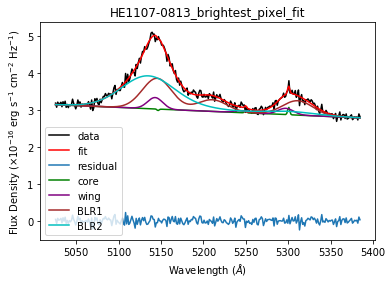

0.003784852611858014 -0.05900220582404003


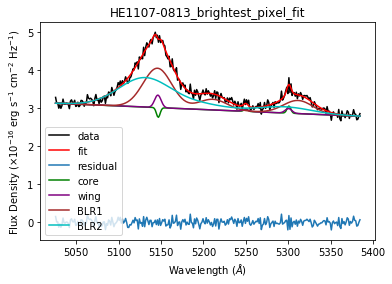

0.2504637309336273 -0.001287838375967354


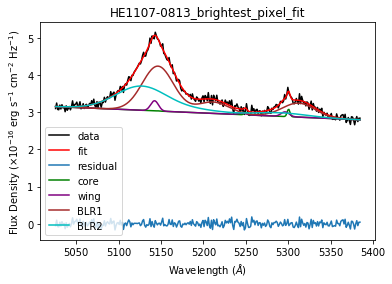

-0.26311231707051697 -0.03539939261435254


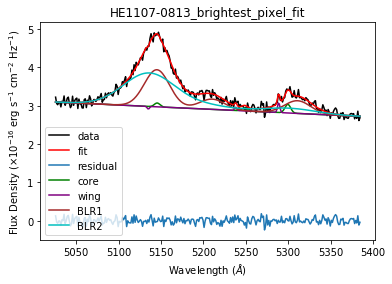

0.39727668623061074 -0.12291081278221405


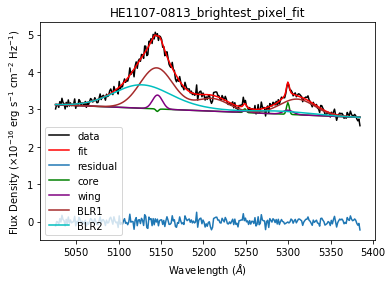

-0.11629283049346473 0.06054930681422466


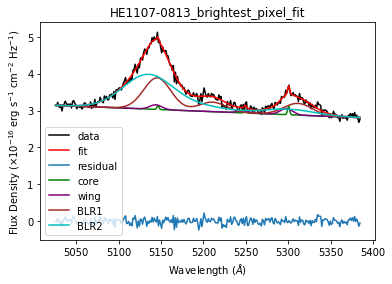

0.01670905238408693 -0.16718740575352165


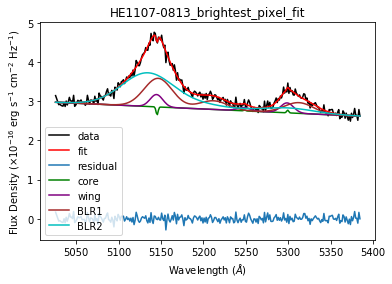

-0.08223229029999146 0.02266882012521787


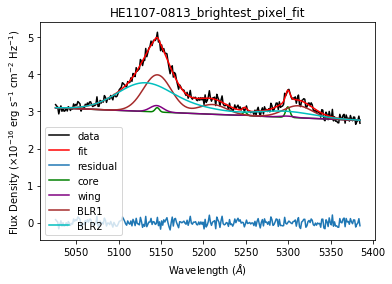

0.15313604880146858 -0.08674034154654908


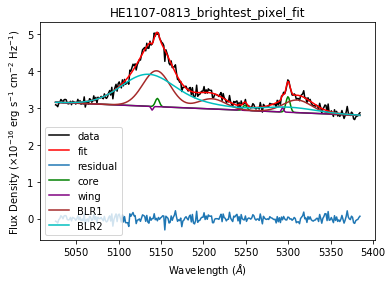

-0.12053777489063044 -0.03556434861281055


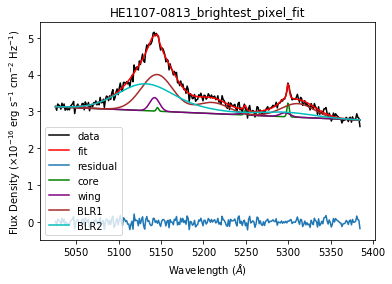

-0.1749396208642393 0.010898290289082624


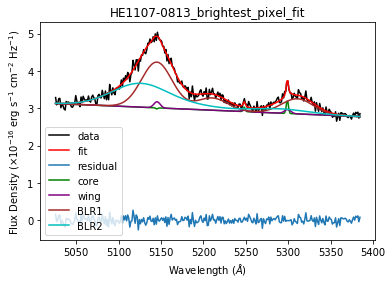

0.20832704017818582 -0.017824345918875828


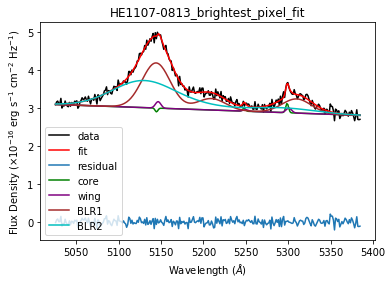

-0.039551202126220986 0.11714855963391191


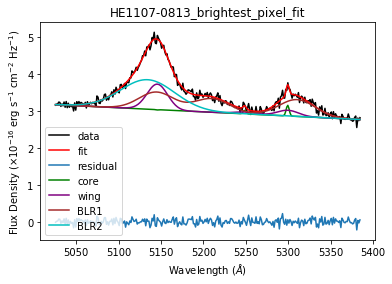

0.020787802386530885 0.15524554611078134


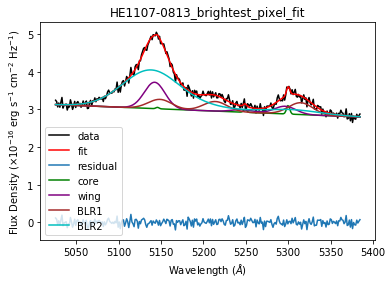

0.002814755087018561 0.04576411486619758


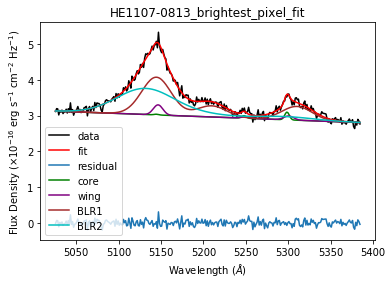

-0.033694937020404936 0.13339544709746853


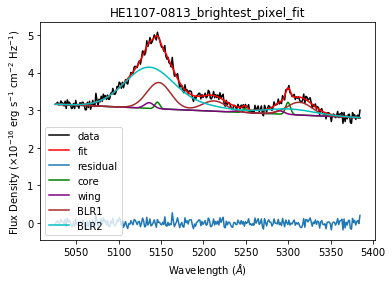

0.1305132359597172 0.23735218125826485


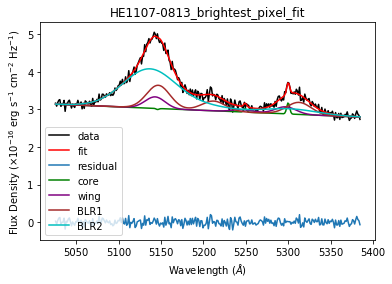

-0.005541676548434182 -0.043323305873800955


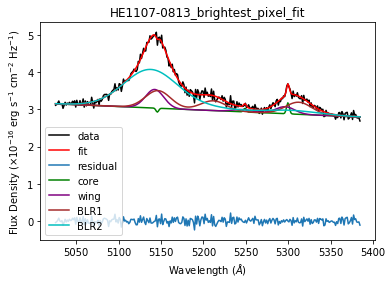

0.008210857162116447 0.04642654316681316


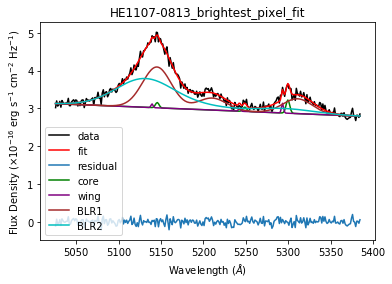

-0.042327419421250845 0.20864132245896982


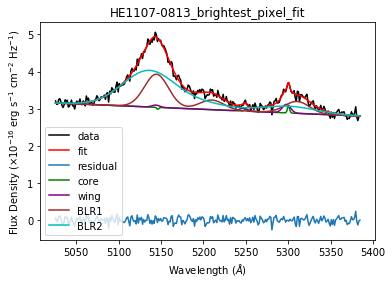

0.004279276343327254 -0.033114340444013735


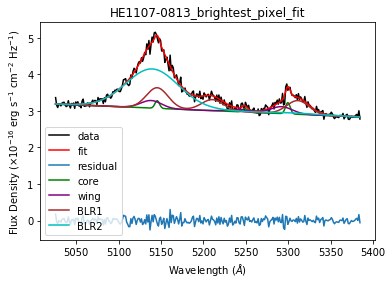

0.03955471939666033 0.17285208427817533


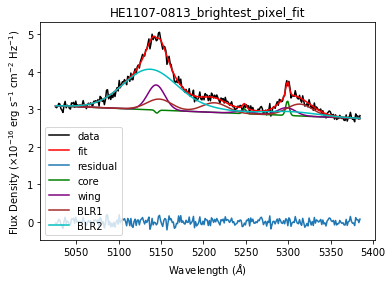

0.07324491062601002 0.020571140018291523


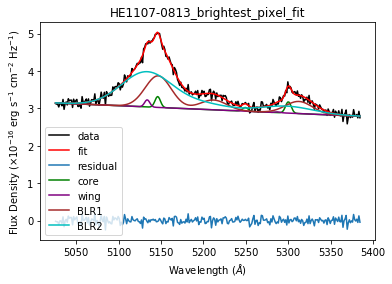

0.015040542261265166 -0.26837340910490415


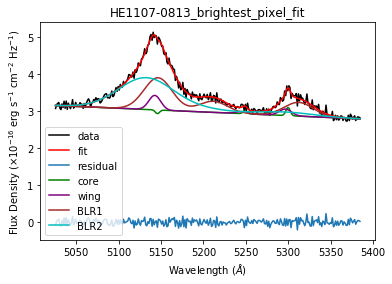

-0.047319329242013985 -0.03419215033016876


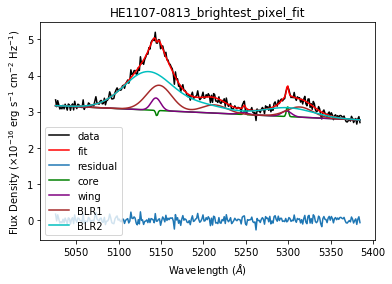

0.002559122409445891 -0.17779317748866674


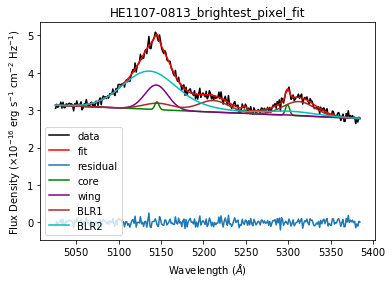

-0.35621953092339886 -0.00964746520173776


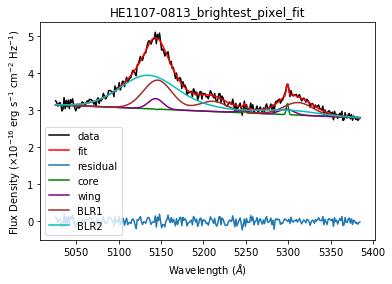

-0.07435759901568417 0.02551776650302351


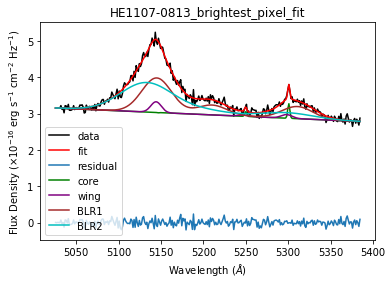

-0.10960510170691862 0.021837615541278943


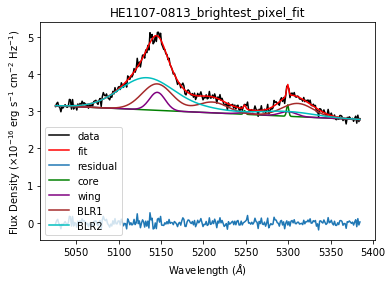

-0.008728916487648952 0.1555592146121958


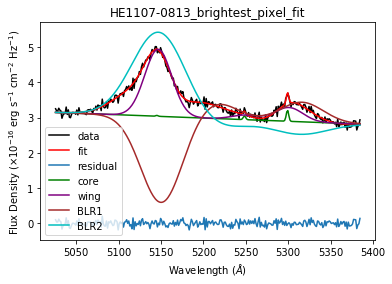

-0.0635756672554546 0.00842673383655601


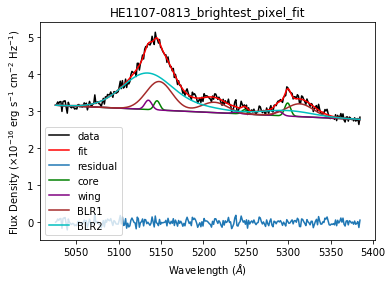

0.06964279464633716 0.4397379034462059


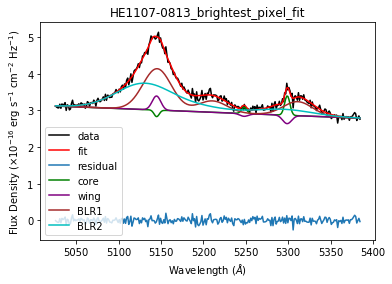

0.4050292171132961 2.985104801470378


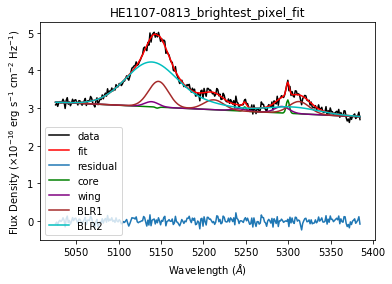

0.033501014427853804 -0.026988805070823574


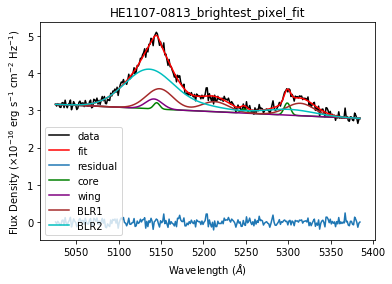

0.24978060305792926 0.07353790862463239


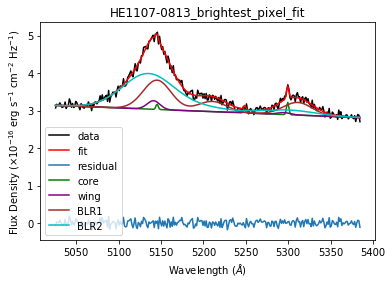

-0.1199440869002606 -0.06451146274518749


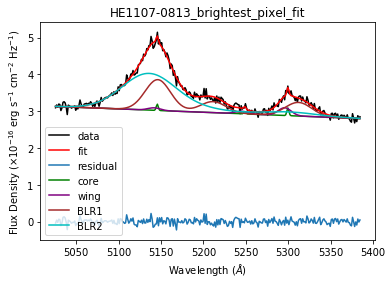

0.10979348994082727 -0.040960425763286956


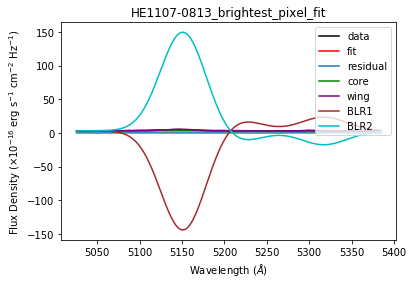

-0.11428448977102335 -0.01171164153346993


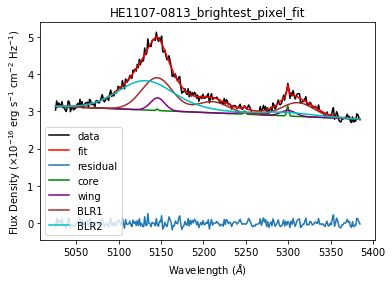

-0.12041867927463379 0.047267586344502455


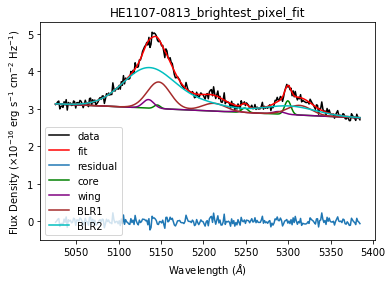

-0.07411402149517077 -0.2688848844204914


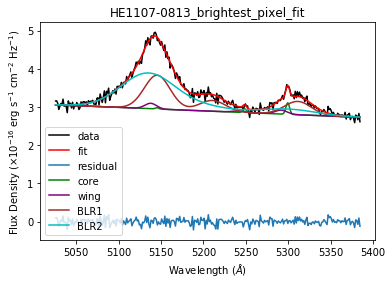

0.13159457910612016 0.22377656826806636


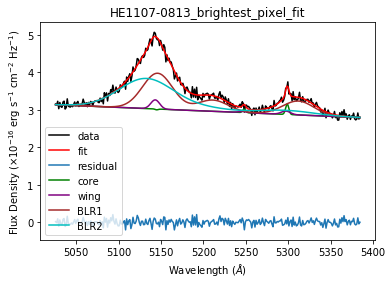

-0.002959005314926877 -0.10175565933177655


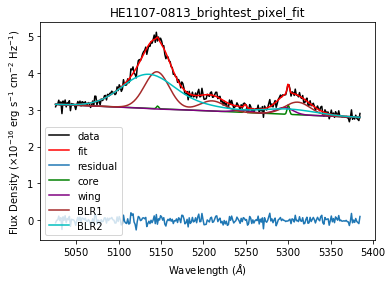

-0.02963407188753564 -0.07697213974443873


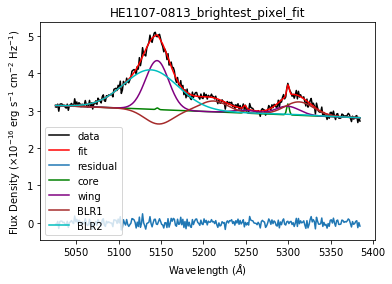

0.07262514287564681 -0.0487757504617603


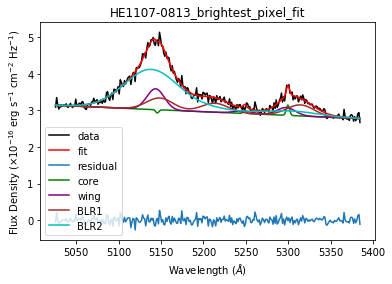

-0.028481781055564426 -0.05761357796079469


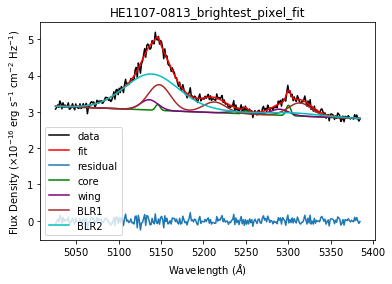

-0.03253813665342342 -0.005973702964203298


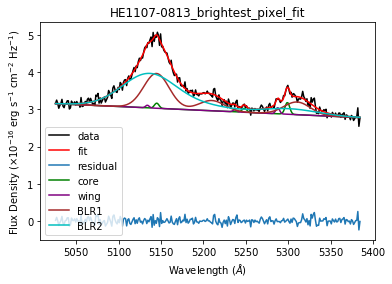

0.2602515091641626 -0.2058242333141429


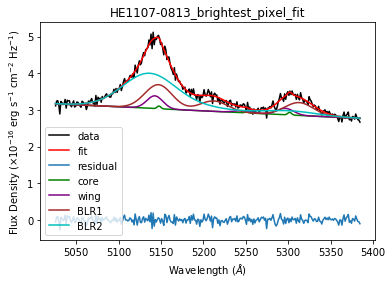

0.10131522420384709 -0.0758395831423817


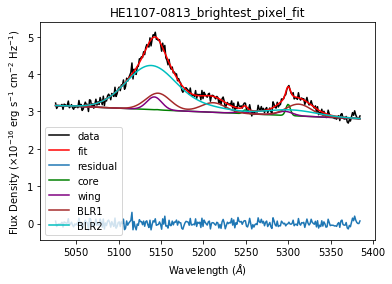

0.08367450434893531 -0.22713449937525532


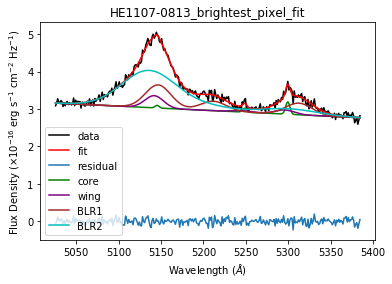

0.08912089515734767 0.021479559404703252


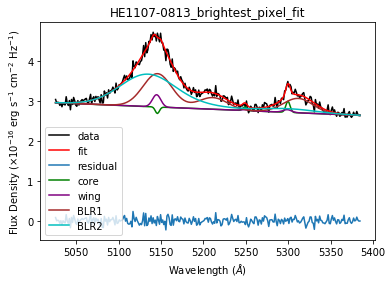

0.15699701350592843 -0.03361305183695418


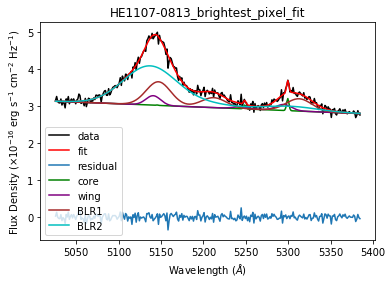

-0.09121959270579083 -0.022030865582611803


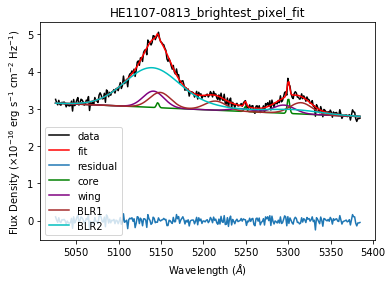

-0.02178492210906846 -0.08518234816351189


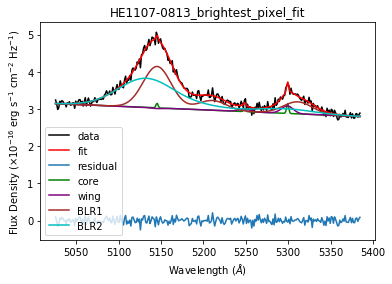

-0.0802472272023591 0.08269245079918264


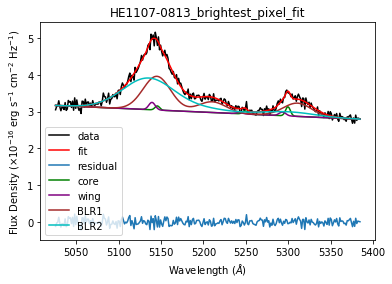

-0.283371469125016 0.03844511425432362


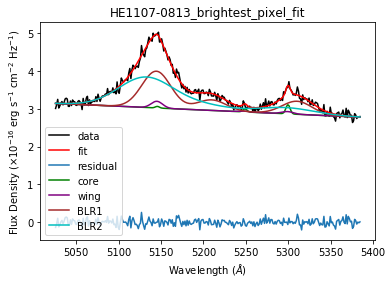

0.10139982197883768 0.35801390100207


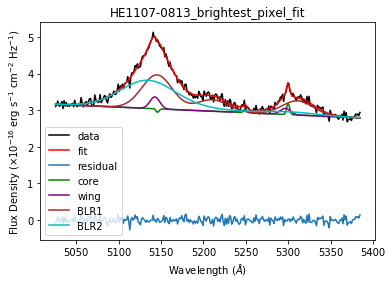

-0.05172631576981157 -0.13188669381070017


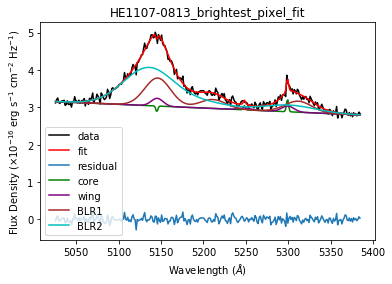

0.02659251446940214 -0.010411990442661612


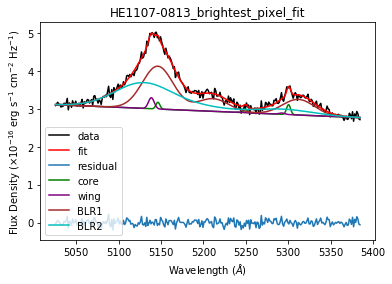

0.15097101735293972 0.11779161623883017


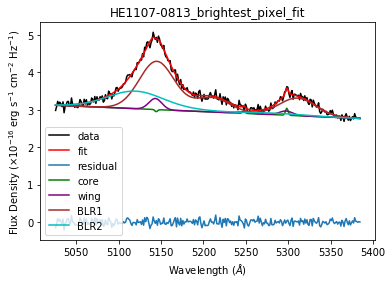

-0.03242653201967016 -0.058222666270521195


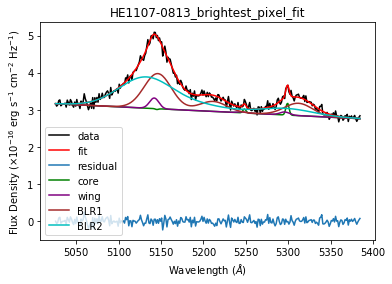

0.23567177487048951 0.28402054860400394


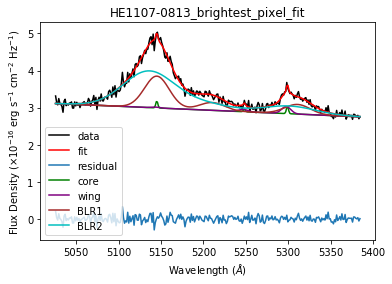

0.03229494645784836 0.02965666835093117


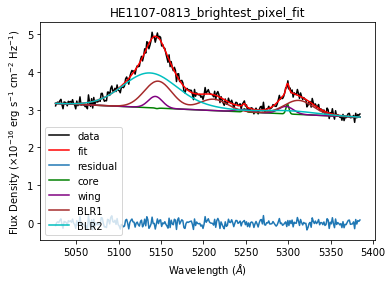

-0.056762011041433524 -0.03514655441374259


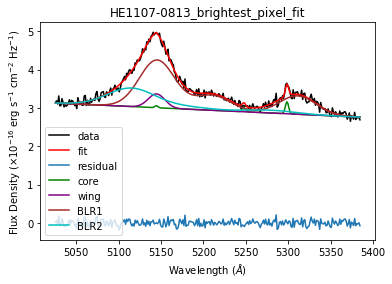

0.01846492772545716 0.019731054728552522


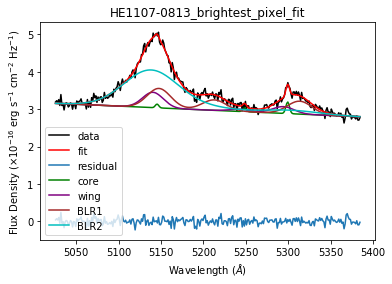

0.008463322676442786 -0.029127123968207158


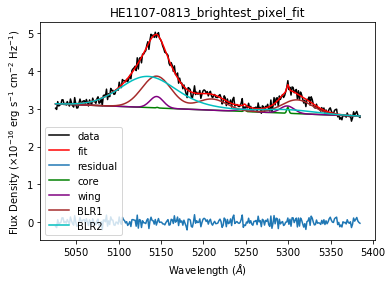

-0.08994736270221626 -0.054512239932433815


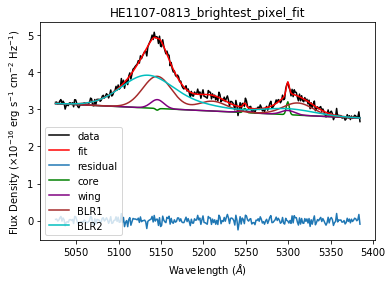

0.11408664045924066 0.08950394441269172


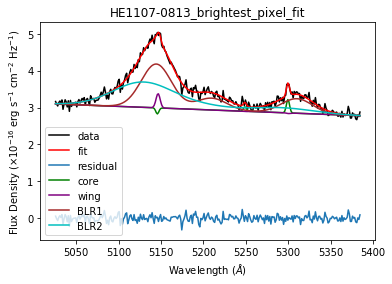

-0.04207020767391789 -1.210141796243704


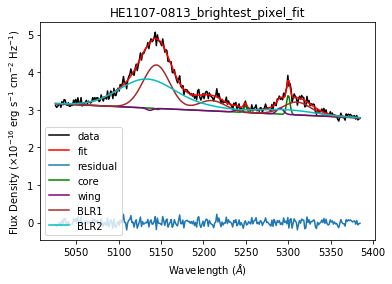

0.2925706393615952 -0.06101721968329965


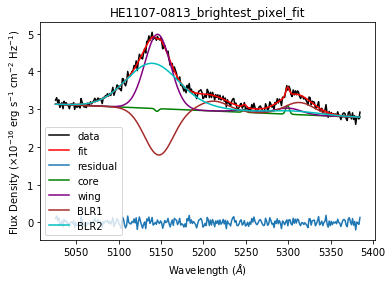

0.11418565020013105 -0.08745569203613535


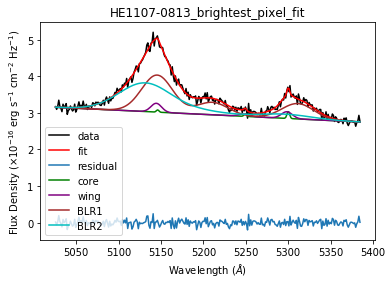

0.003538750924952261 -0.08930160825505506


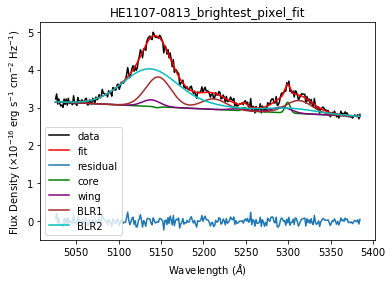

-0.12129753635692975 -0.046280312463229833


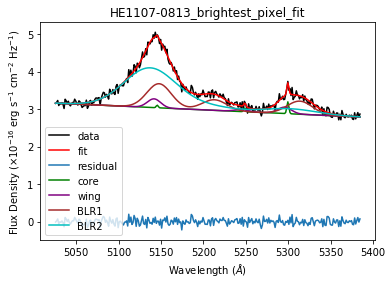

-0.13007610003372605 -0.057700920746921014


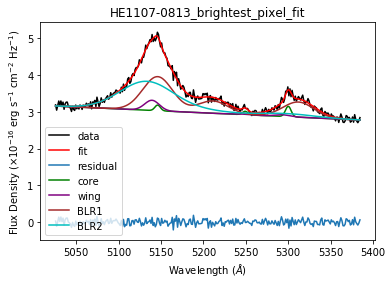

0.16650653093740786 0.30247371870701656


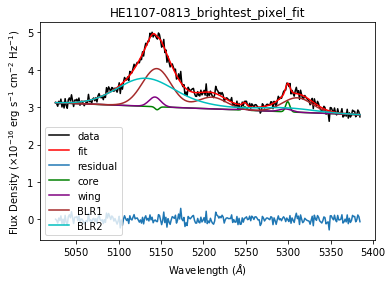

0.12556121721931746 0.0340398874122565


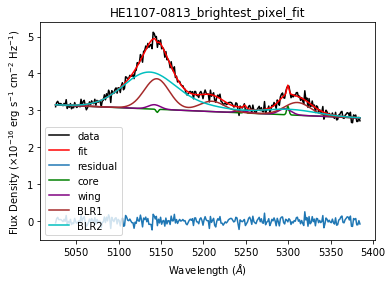

0.0098881063016103 -0.09371364463891485


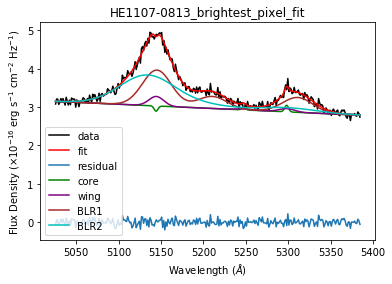

-0.18217958446270277 0.007067214624568052


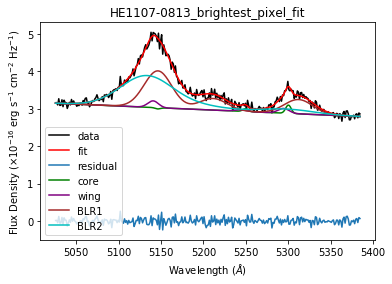

0.05036479422180218 0.04146141434096684


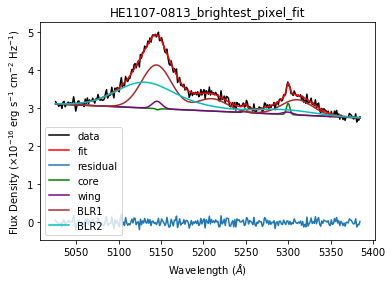

-0.06272791331706351 -0.18638639088110587


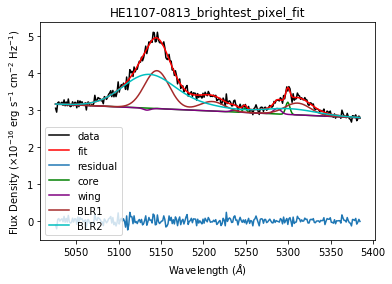

-0.09809921767309326 0.1179140347991039


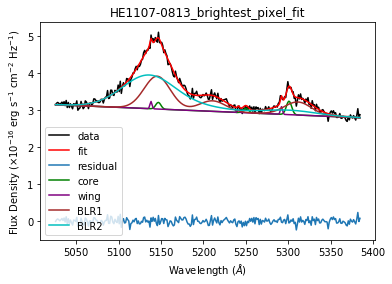

-0.21985319001362313 0.08446041469930865


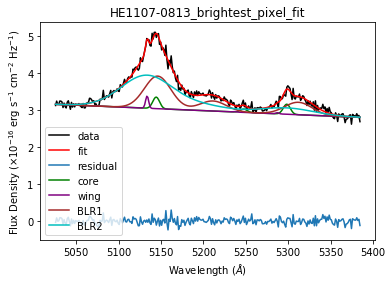

0.20300509456527838 0.15758226827631372


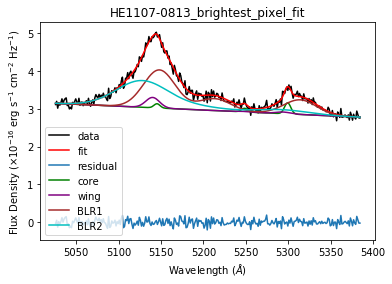

-0.2536620825988365 -0.06654906787094816


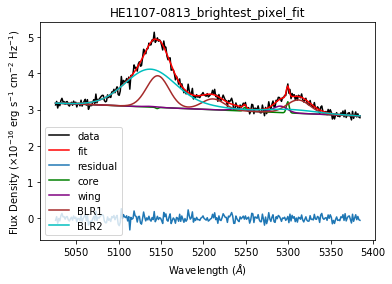

-0.03568529109597929 -0.0608161965162175


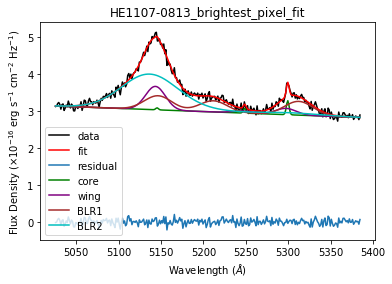

-0.09414408485343095 0.12452036760169882


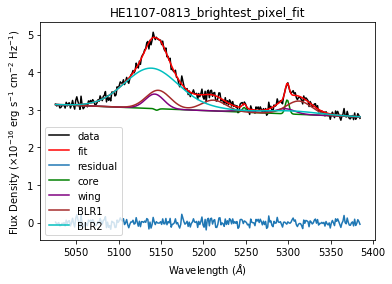

-0.045132513819714504 -0.07678408285173877


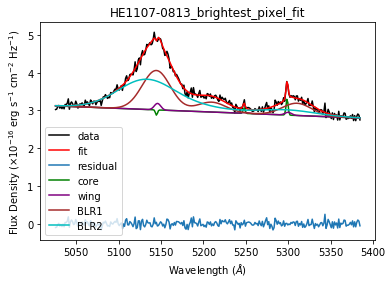

0.09725323345880188 0.020519402749876292


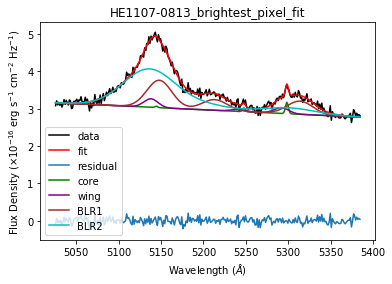

0.10838746059188331 -0.09038490527609966


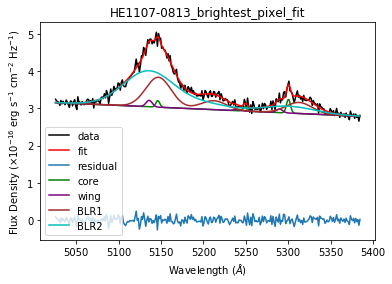

0.06383317759640317 0.24100299595643815


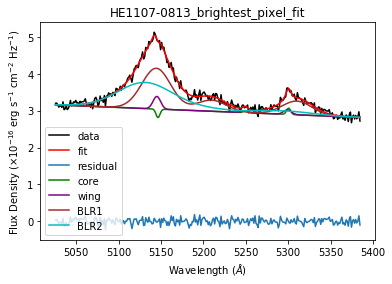

0.20964547161892888 -0.19031664645943547


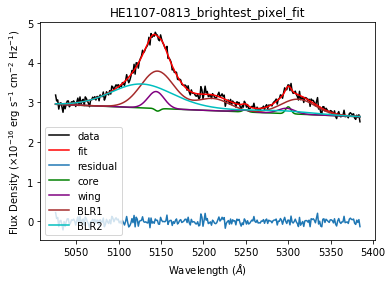

-0.10775337787079664 -0.31657051567360295


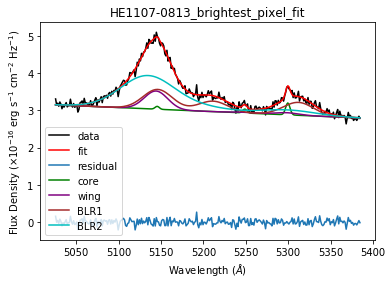

-0.0714722340067846 -0.34849813626055237


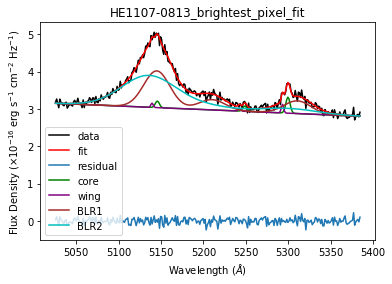

-0.16685867440555135 0.15506198171636232


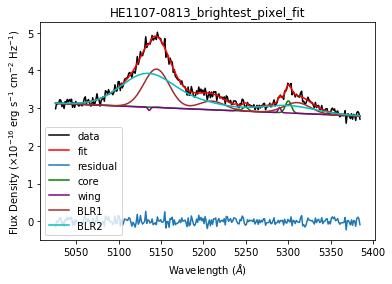

-0.21930364116312173 0.07620758768039959


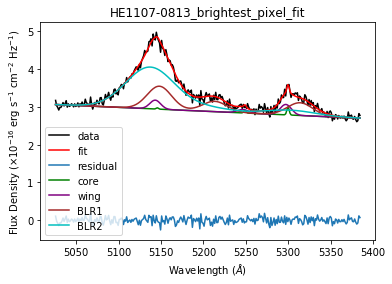

0.019914111643348775 0.15228392960407078


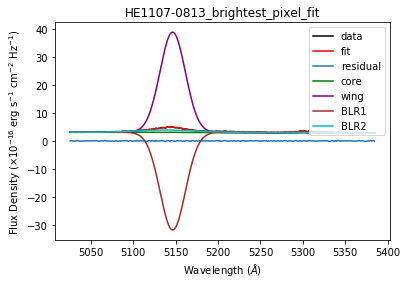

/home/mainak/anaconda2/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in power
  if __name__ == '__main__':
/home/mainak/anaconda2/lib/python3.7/site-packages/ipykernel_launcher.py:54: RuntimeWarning: invalid value encountered in sqrt


5.478815310804919 -2.9574171159327847


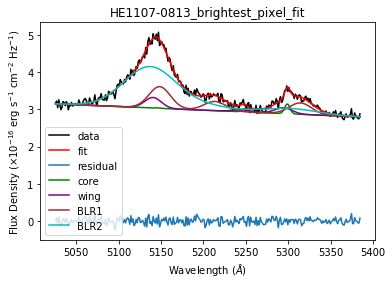

0.1300271597635625 0.010233285655662172


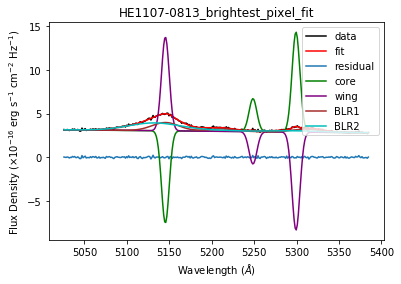

0.06226343746325469 -0.25456017152100063


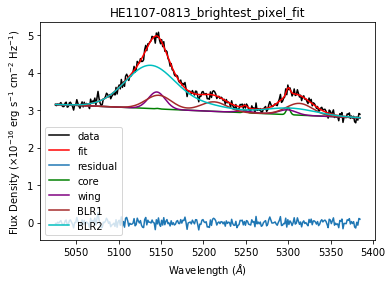

-0.02462566283206513 0.08822156943258541


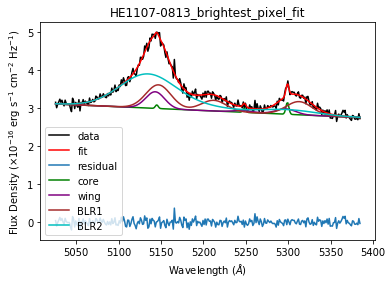

0.04776194829208347 0.17222104766590984


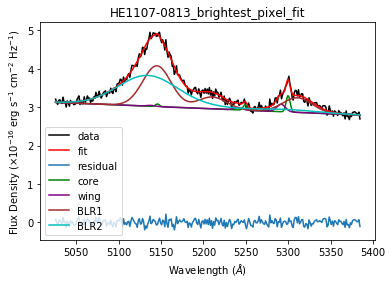

-0.0985181120235259 0.04069634890146823


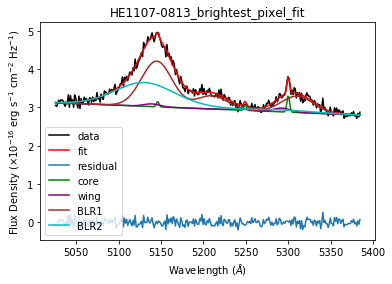

0.09980375514207651 0.11168373509744445


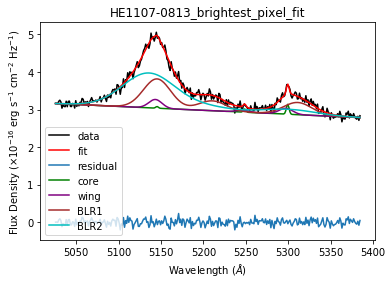

0.06138872069054102 -0.04940195980526685


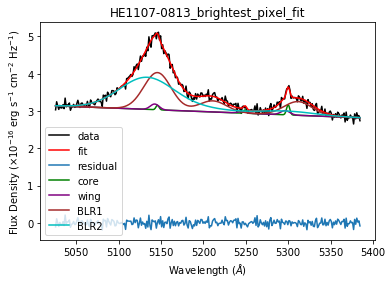

0.13930741522395973 -0.10628983673743608


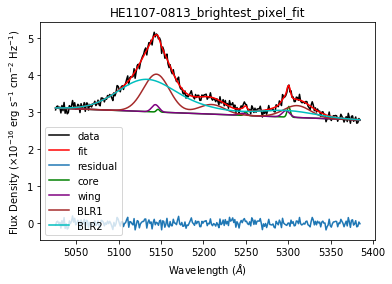

-0.005141093235304872 0.08143647952633781


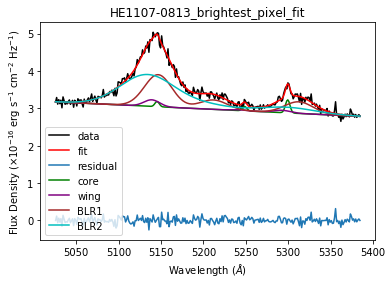

0.16240840816244617 -0.030967640333897428


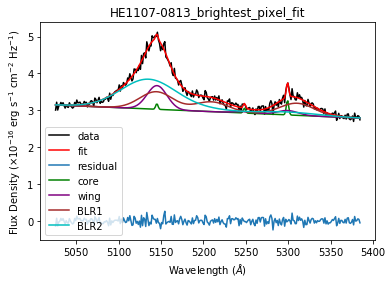

-0.023443080126886784 0.11126016551587803


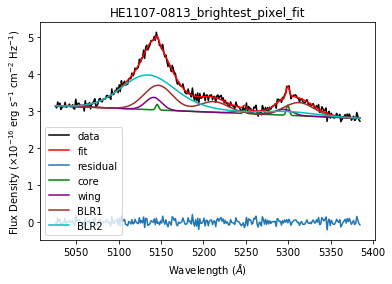

-0.027924012364499262 -0.077550046486901


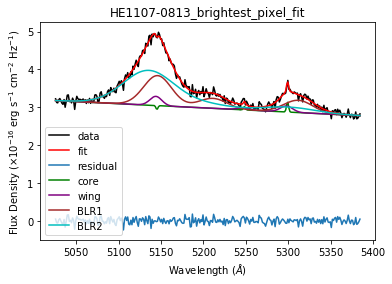

-0.021407226850417516 -0.10290727775516739


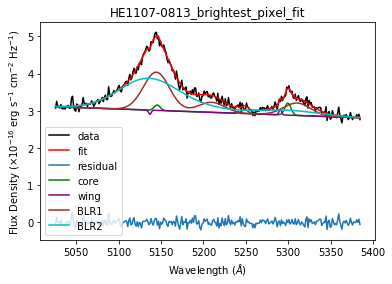

-0.11072865550092992 -0.4514922719899017


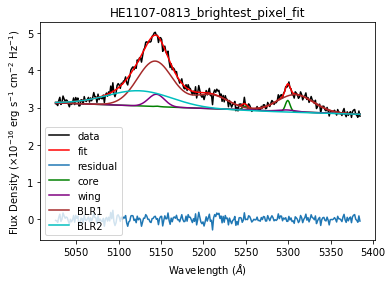

-0.08511058126213733 -0.25411647620026123


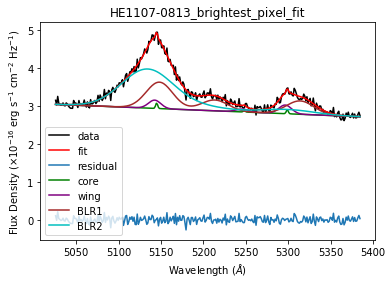

-0.09140930158670724 0.010257685471168898


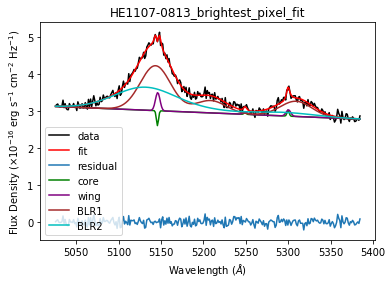

-0.1567410599798773 0.035755784923771294


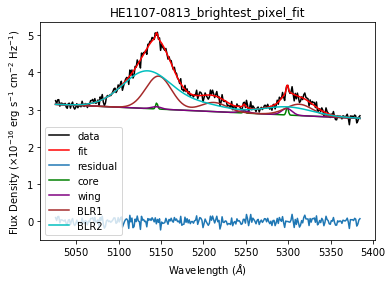

0.12577325060402966 0.07546345936910193


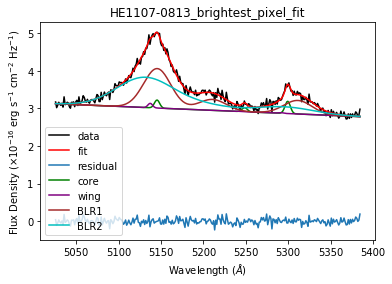

0.1445442495763576 -0.0043712355963165805


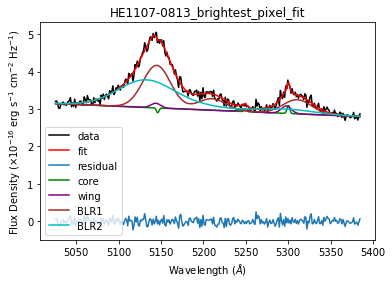

0.10373190973006707 -0.05445408345575942


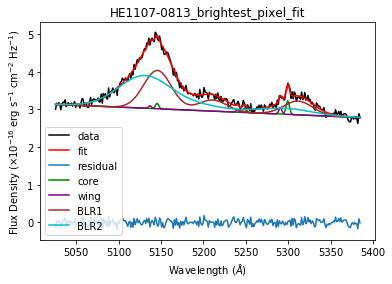

-0.2415957619005793 -0.05098816825073893


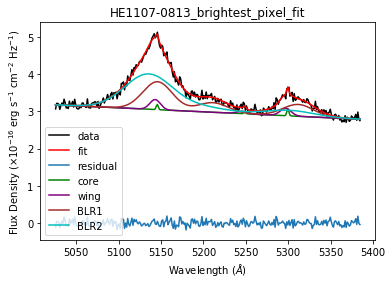

0.04414867935839517 0.009040369171857243


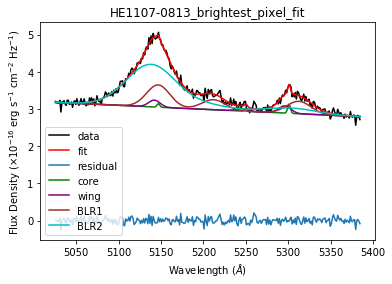

-0.03975246415194178 -0.046438347166971816


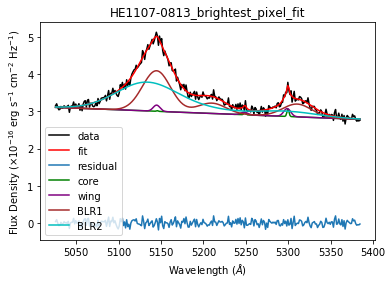

-0.04171043076359737 -0.04102055159928142


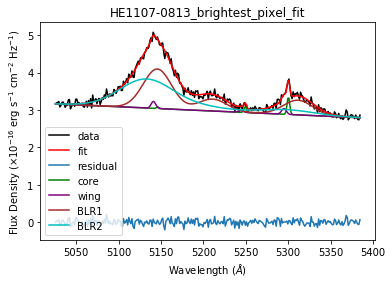

-0.11835312103475015 0.07263522492846697


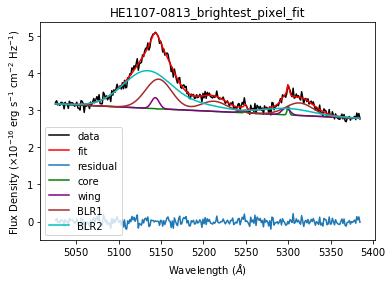

-0.10752933562963829 -0.008566354861678782


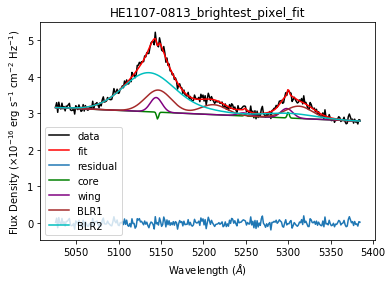

0.12583702302202937 0.10337453765309235


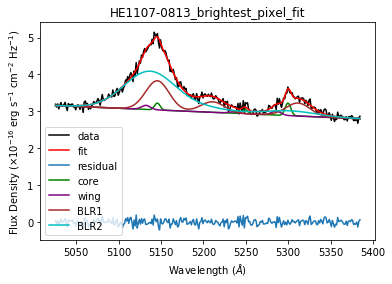

-0.10889823483958061 0.1331234000736652


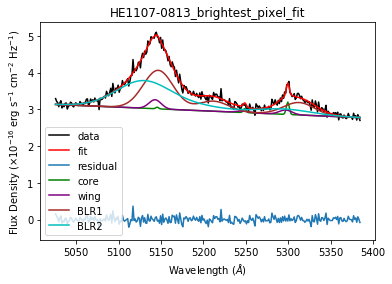

0.14438462841421806 -0.1195135369057585


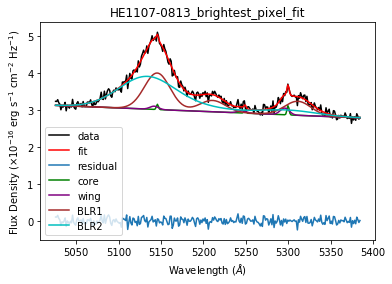

-0.044022560135100086 0.016305416421952934


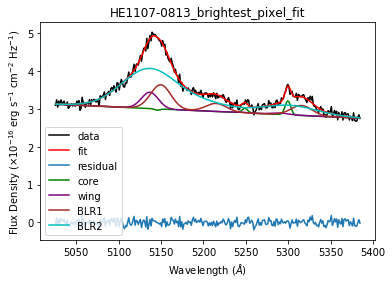

-0.06316855808931265 0.07449122787005802


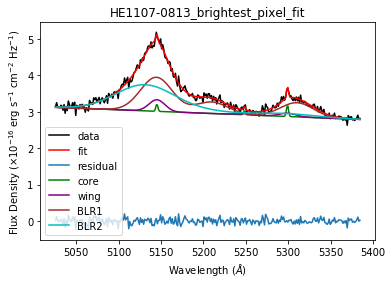

0.06589627236761153 0.16418023177392893


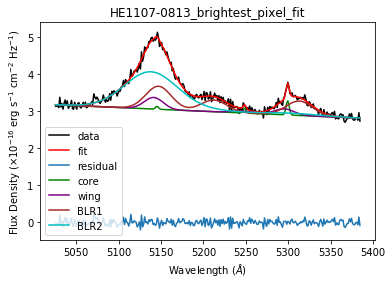

0.10872482146701401 0.034794233479221504


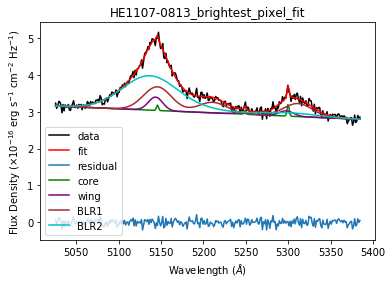

-0.032000814066654115 0.08332204357473394


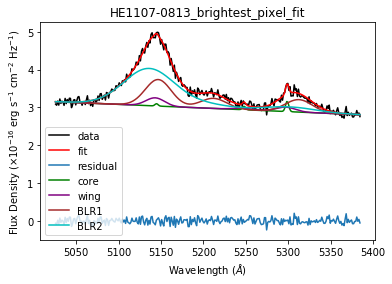

-0.09134568845054858 0.09455222998732182


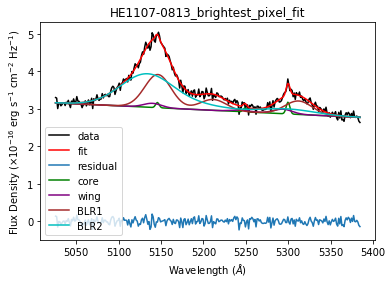

-0.06221034550581539 0.3444985681127344


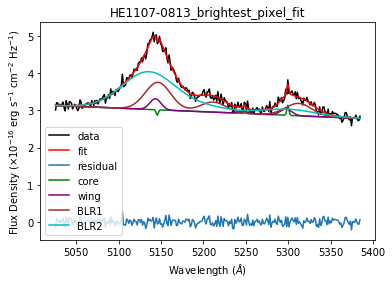

-0.043988001831398726 -0.02820627701747558


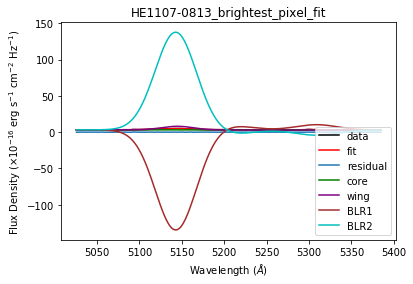

-0.17955998719757105 -0.09832028356608902


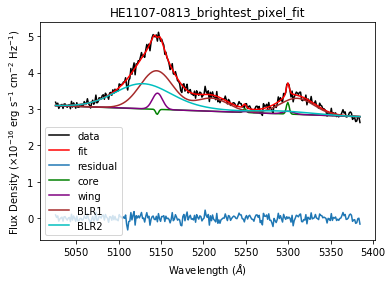

-0.2216452430942617 0.18758671660489146


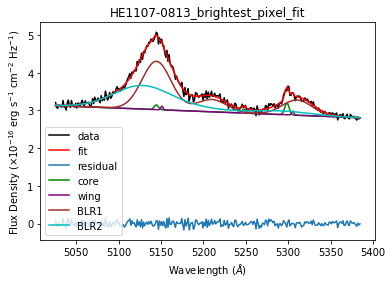

0.49851743662066017 0.17198715595150382


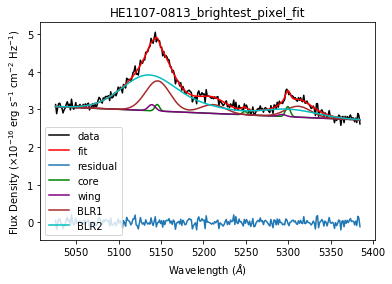

-0.07432702734544883 0.2426963310918948


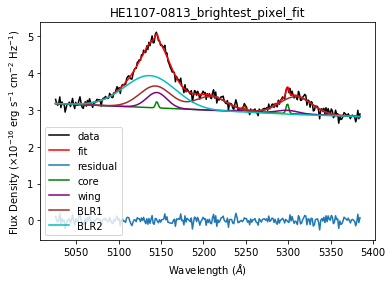

0.07262676853572447 0.040419894651503085


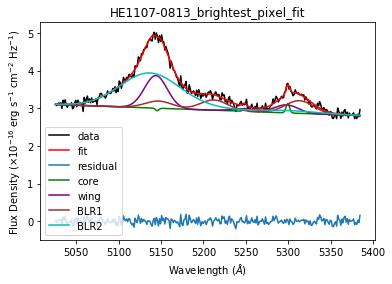

-0.057131070628806846 0.0717258521505455


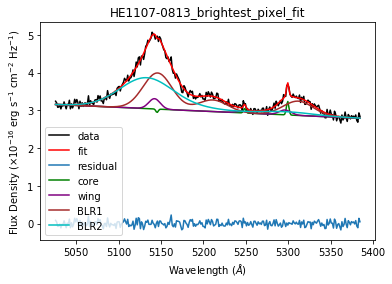

-0.12218233177807569 -0.047888827876080065


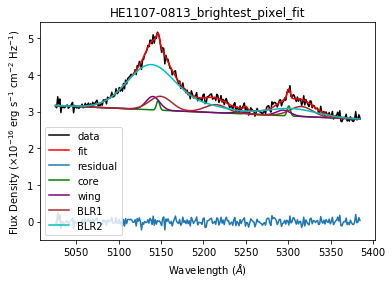

-0.22841433656413912 0.12247223848732158


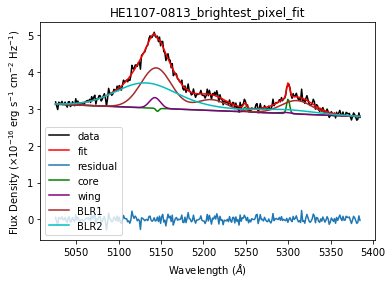

-0.0694968694507967 0.2919106165255556


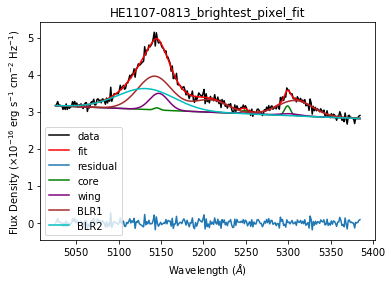

-0.004074398619294151 0.23002412496663638


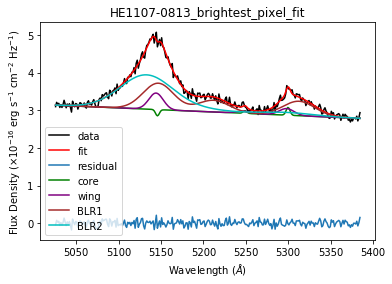

-0.25031582087253224 -0.2545184228829598


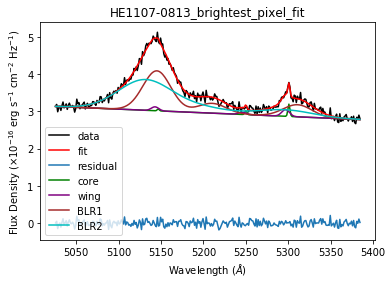

-0.035932303942597166 -0.17492910755799418


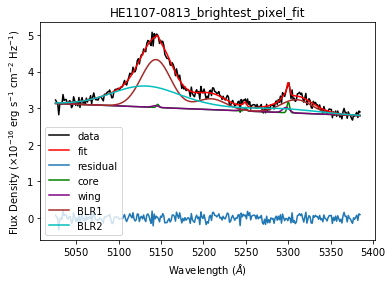

0.10966084426179101 -0.15166167849485035


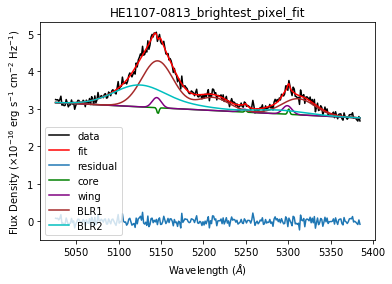

0.06744514847099392 -0.060718272460502654


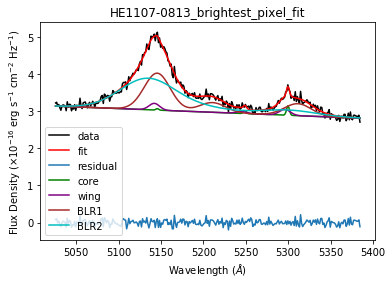

-0.0756638903058553 -0.06543076012666305


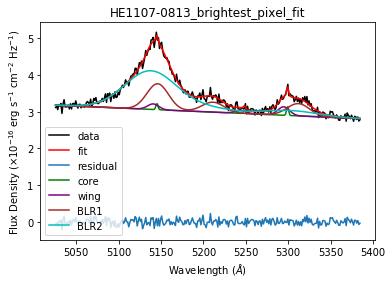

0.07098579060903543 -0.015187468280453587


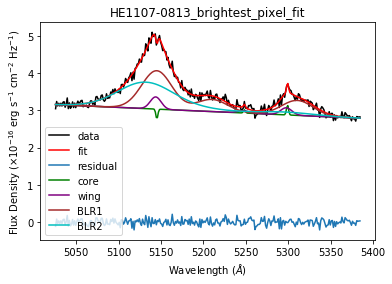

0.01175432786181041 -0.14372546876384984


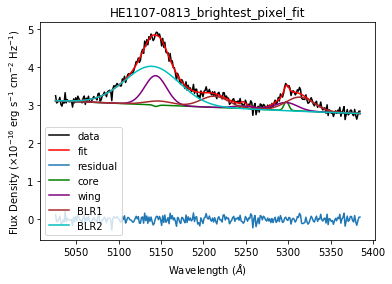

0.017941889549462964 -0.03194173934039579


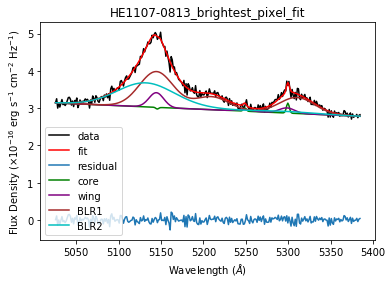

-0.09117664612305454 -0.06104922283026504


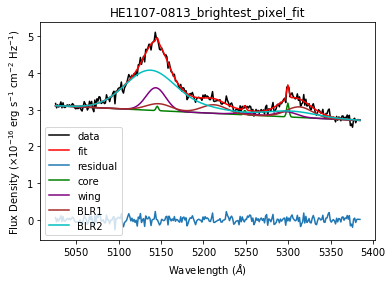

-0.12562039197596153 -0.06712935508960527


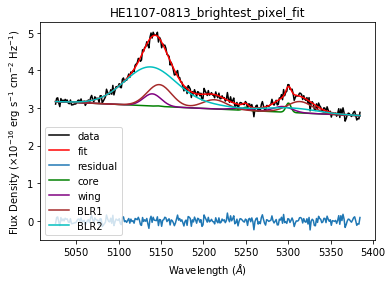

0.15468733744683494 0.05223392663108761


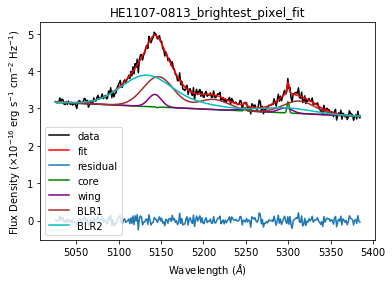

-0.014804704695187354 -0.12501380422333064


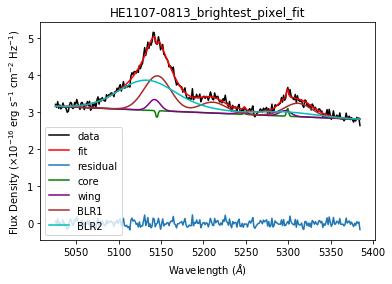

0.039340221957480104 -0.04538367120040743


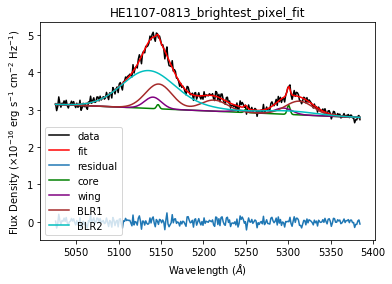

-0.02388860290531003 0.02204749036494391


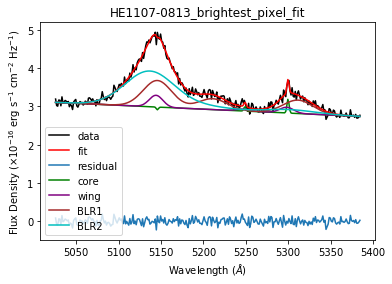

-0.16424442987755583 0.061993344417550666


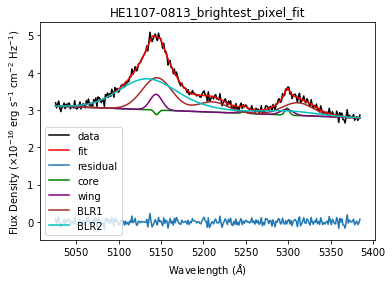

-0.08965703685306181 0.0484873924081457


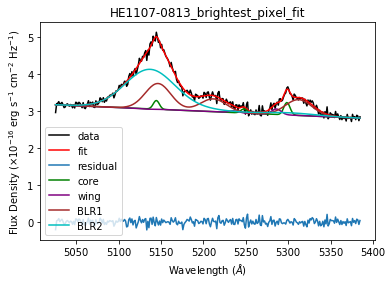

-0.013039888817204748 0.09938202065087243


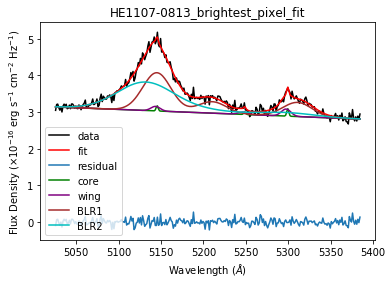

-0.05911510140941978 -0.10367455582355412


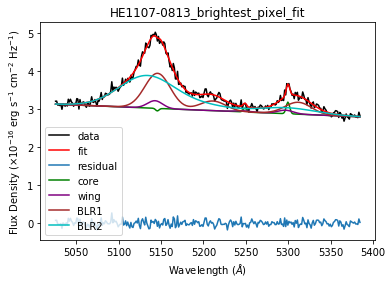

-0.252089392122544 -0.05878577619782632


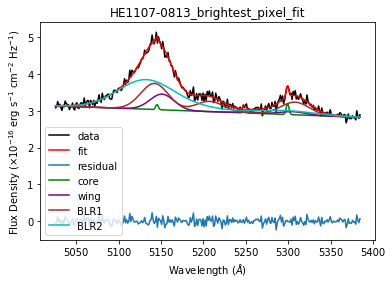

-0.19709051441515424 -0.11292392941818541


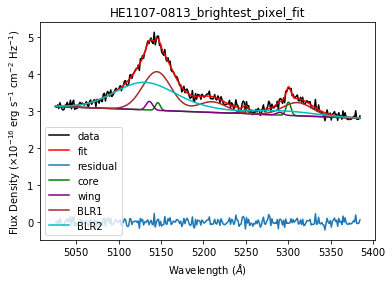

-0.06585856064002193 -0.04124640125437029


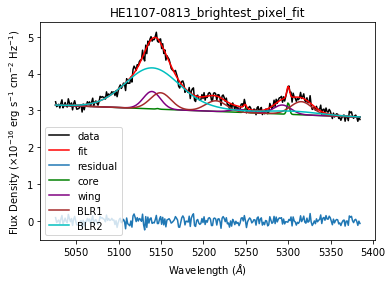

-0.05796407928837244 0.025669578090007583


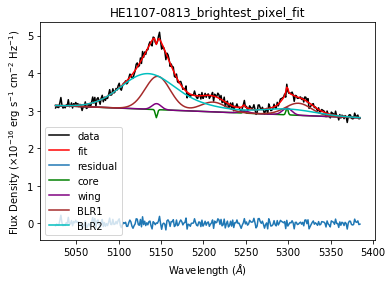

-0.013543570420186946 -0.08102958393790072


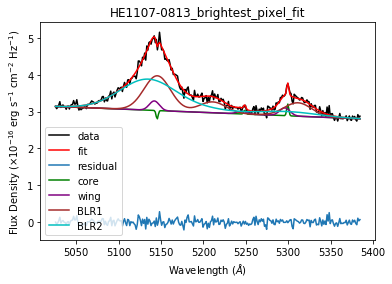

0.05961185749139286 0.13055116016948176


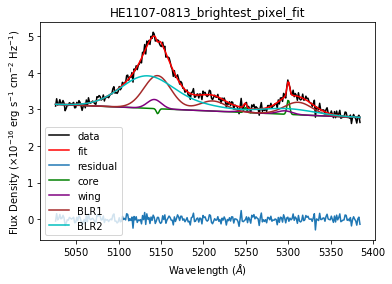

0.2463815537439693 0.14642391221124473


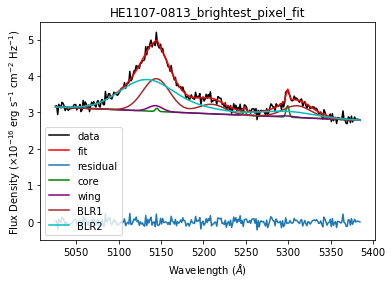

-0.16180464962823393 0.13055223710603947


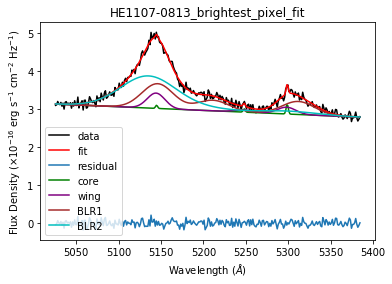

0.09372797980949166 0.08478804606099555


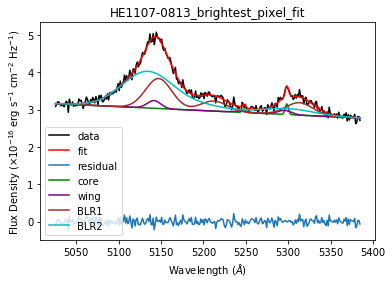

0.040392499597951215 0.20914296323668324


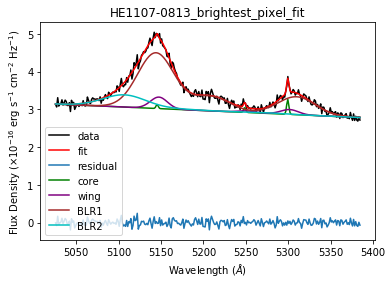

-0.056405109082382054 -0.3864676092777968


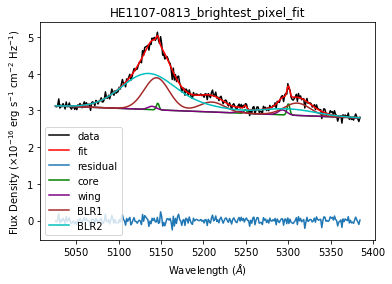

-0.08474407113196314 0.00039480237251154904


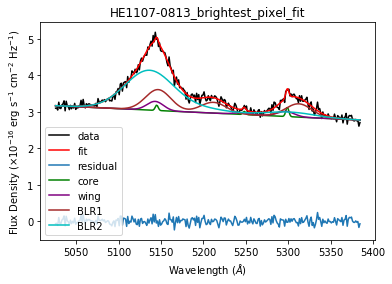

-0.0069587209487611545 -0.18781155820995288


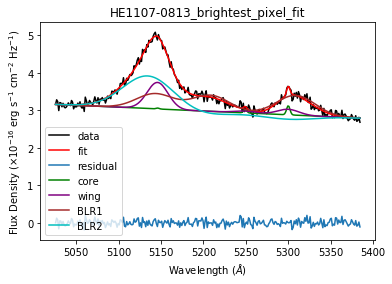

0.21022390982696404 0.06297798113452213


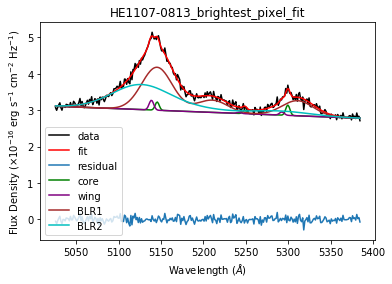

-0.061981732085021335 -0.4475833715483981


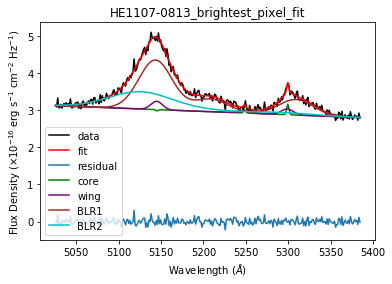

-0.029419439567568872 -0.2205845305418075


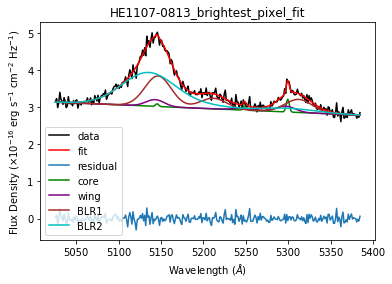

0.0745952546810269 -0.06169234509994315


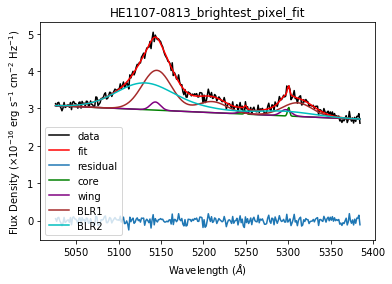

0.006612027886055749 -0.06999912974700617


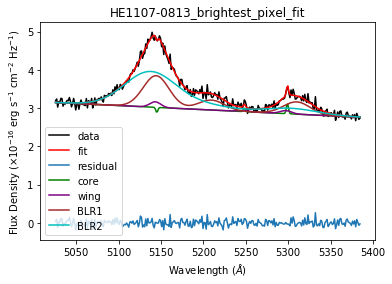

0.19846802824188803 -0.09814097935309452


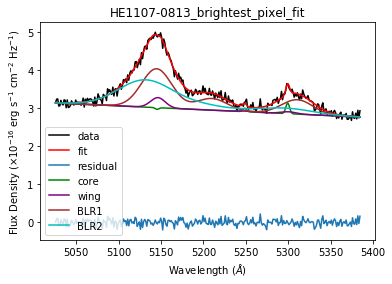

0.03890491017648312 0.3283715096040689


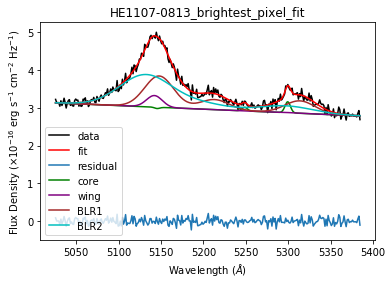

-0.18732763344020764 0.16248378195647994


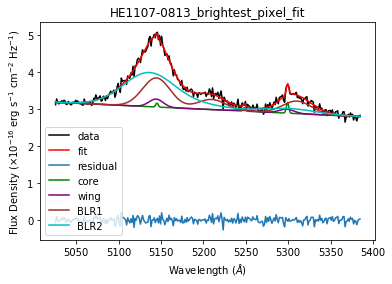

-0.09864925616888787 -0.05350458811827341


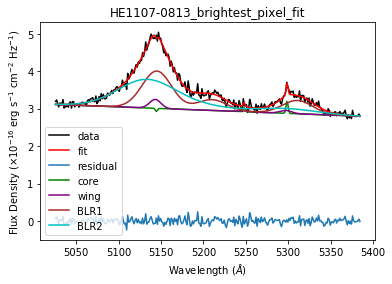

0.04661397873799711 0.11382904625942558


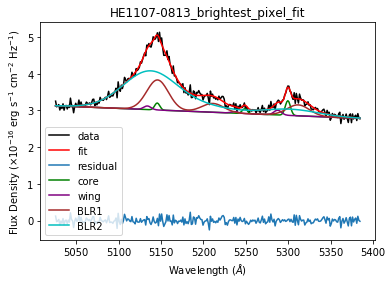

-0.13697691673661616 0.06238622189197951


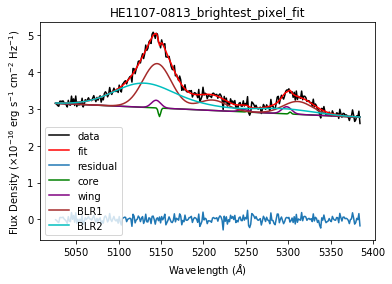

0.04493379031287592 0.11007626465260323


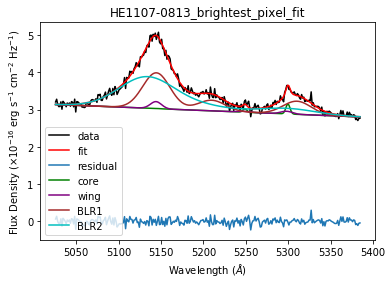

-0.02361971864805934 -0.10058057065471004


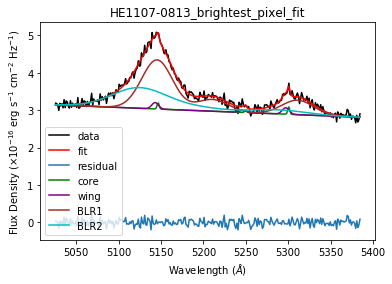

-0.06349705055663435 -0.12008325842752399


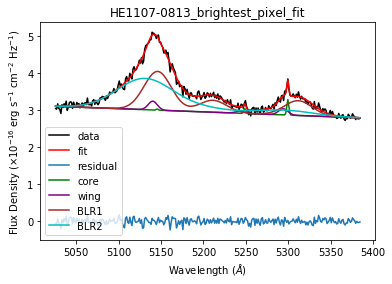

0.24070273718187263 0.056287066053752


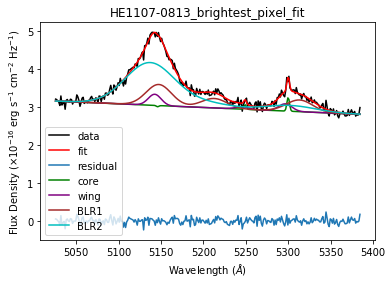

-0.08050639333290999 0.035323300773698385


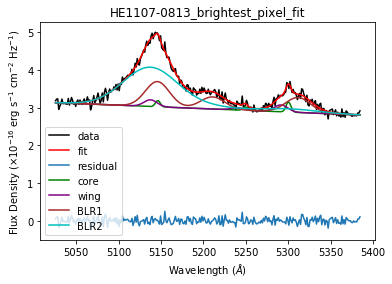

0.19577301739305586 0.05837961987035989


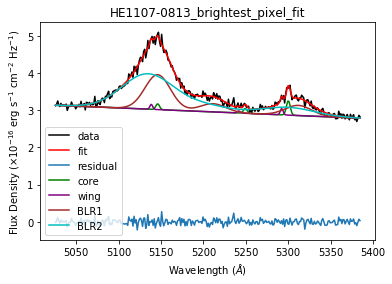

-0.3256967018822312 0.13138453660689375


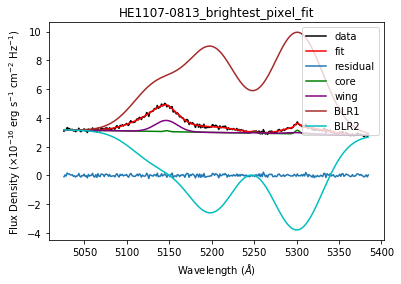

0.5558506025768777 -0.34767073531544934


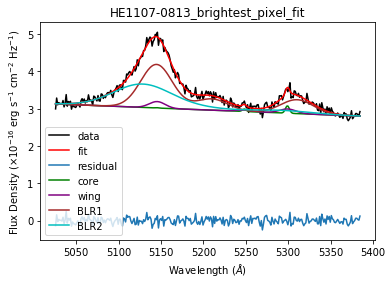

-0.2387925981075929 0.22500615300686366


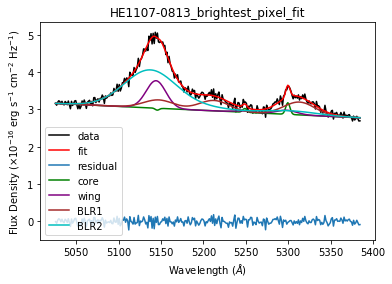

-0.022005033837852572 -0.06029864026790932


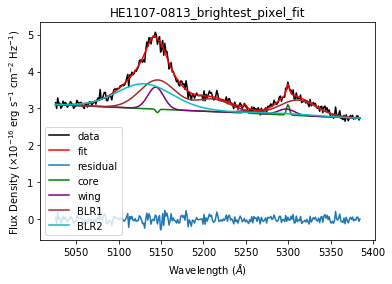

0.18308169892440596 0.08329841417494688


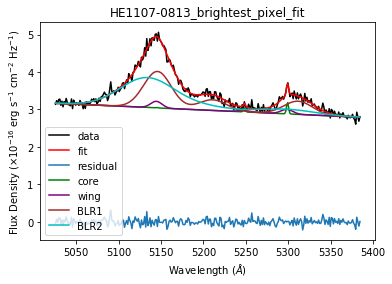

-0.008486021439471969 0.046930796403319874


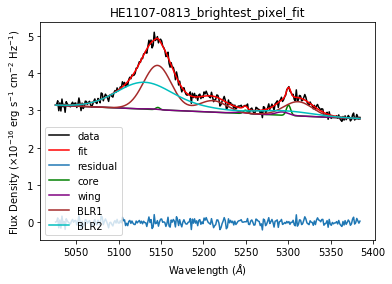

-0.20443847416925198 0.22954366418578953


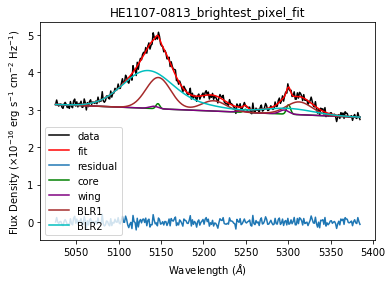

-0.09222348775606637 -0.10258817476614635


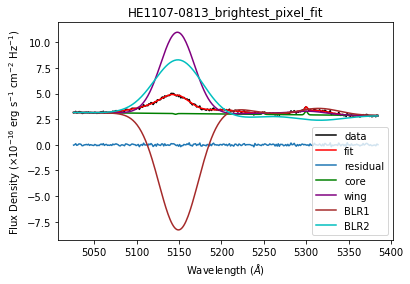

0.0065313597987204375 0.015526343989559876


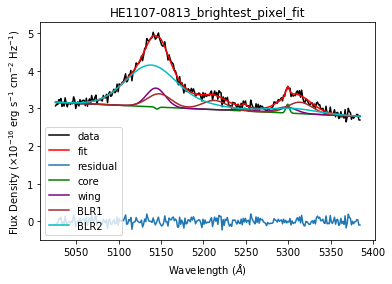

0.053084691494752256 -0.09045412693404575


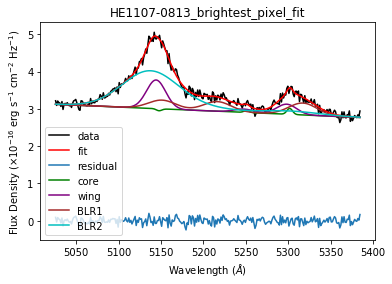

-0.011715111014015456 -0.01906289221632118


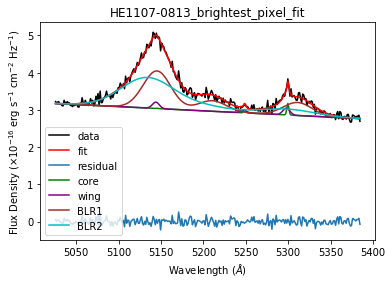

0.0246190410218885 0.020285125390039127


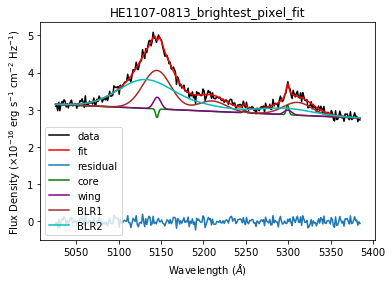

0.261439219120283 -0.3629964305701927


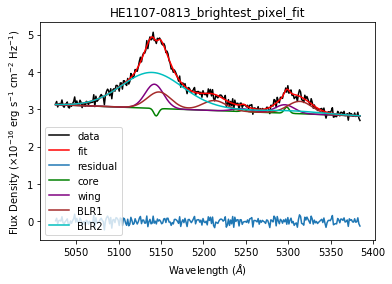

-0.02056895549030635 -0.012108047906650654


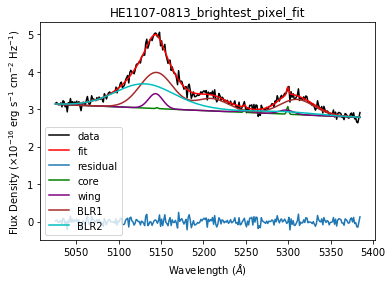

-0.10960799869140381 -0.08392566775079668


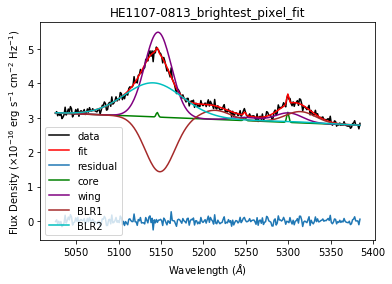

-0.07126799445441989 -0.0067256790034102565


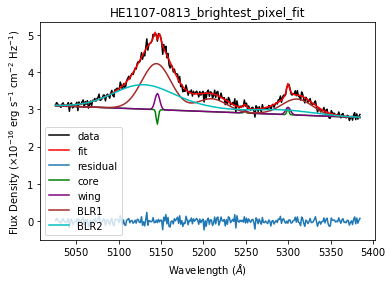

-0.001838270320138058 0.06483716505478654


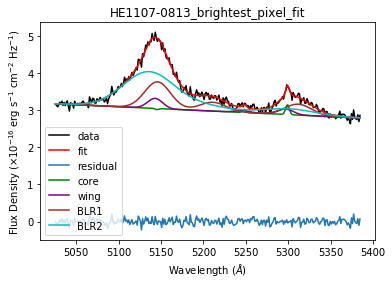

0.16274955566666804 -0.009711713001783195


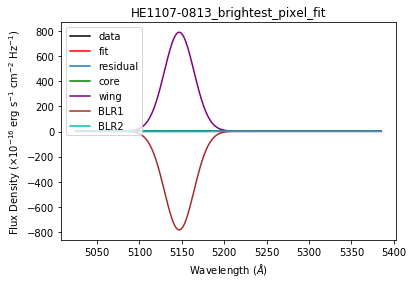

10.106641781519562 8.349999448629859


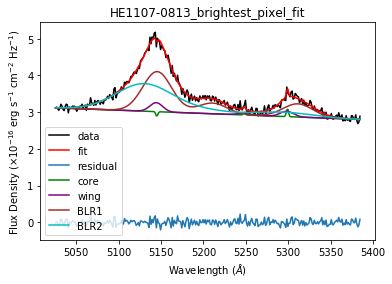

0.04008371261058308 0.1060226382974161


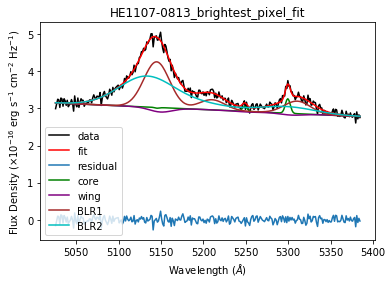

3.5093212273771552 -3.610306071478974


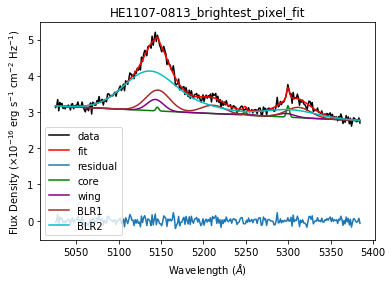

0.03792450634250599 0.04247745875415898


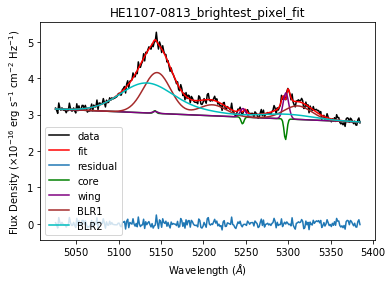

-0.03333902881634199 0.025272184260660246


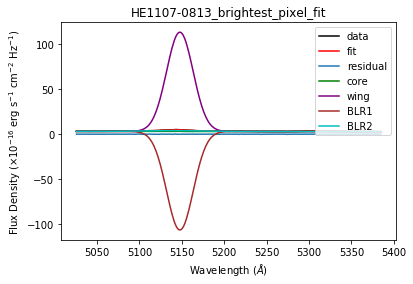

/home/mainak/anaconda2/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in sqrt
/home/mainak/anaconda2/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in power


-1.1554633833832053 9.201245369062704


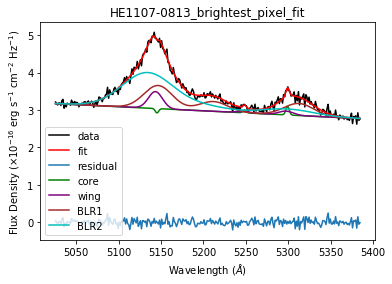

-0.1758282358586154 0.14744250212707755


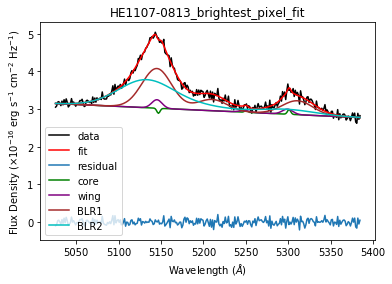

-0.1319582127888017 0.1381184669293205


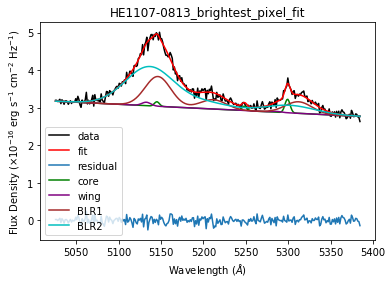

0.48235279014925503 0.15248110022957562


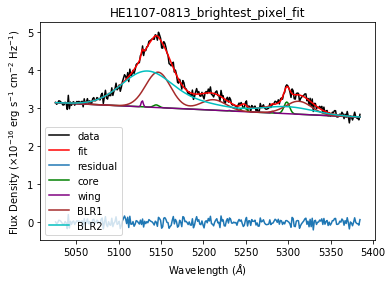

5.244519983864884 -4.905307063119457


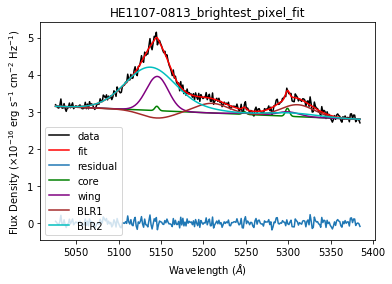

-0.28317944561549435 0.17340625631045903


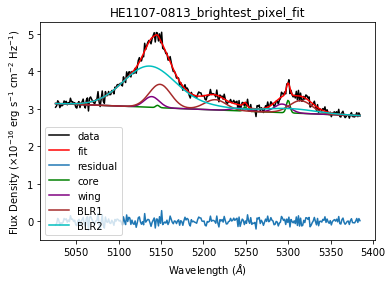

0.05876555335147504 0.1470062942437771


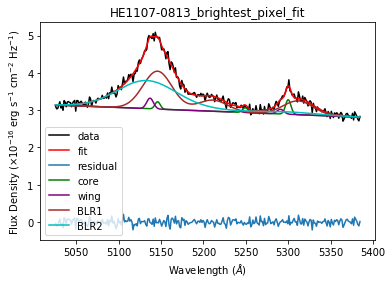

0.17911545234208326 0.007841293296938723


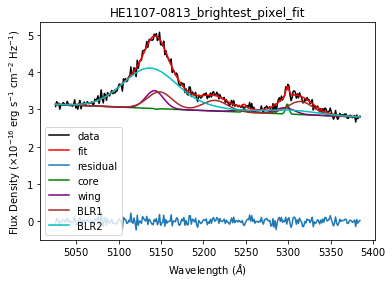

-0.025423319843465464 -0.03364704726096068


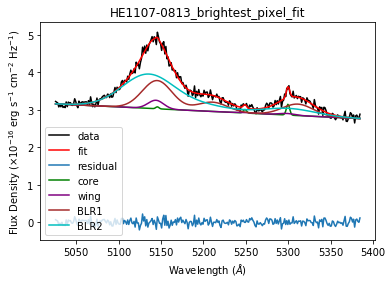

0.019834194661523696 0.013325580890063193


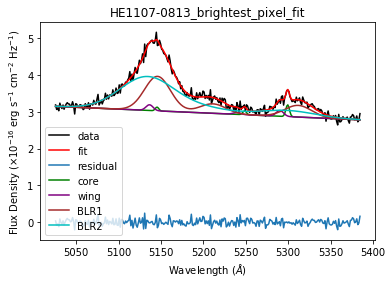

-0.09010015030527985 0.036380384823829104


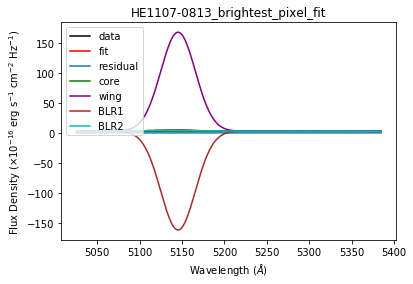

/home/mainak/anaconda2/lib/python3.7/site-packages/ipykernel_launcher.py:55: RuntimeWarning: invalid value encountered in sqrt


-2.173886197440205 1.1544355816462701


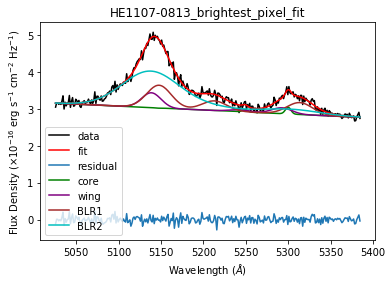

-0.03484458203245566 -0.029137353643988284


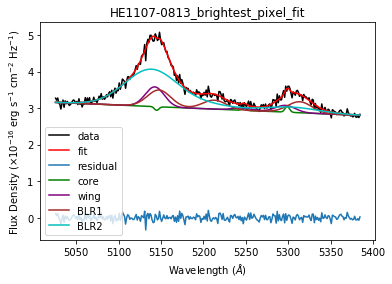

-0.047996744462262875 -0.09151066650444761


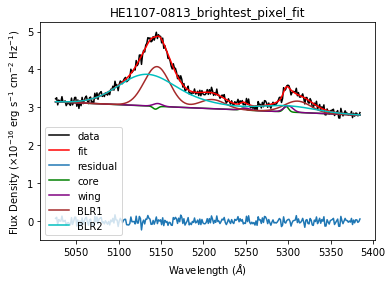

0.0600347407448778 -0.22531544732490438


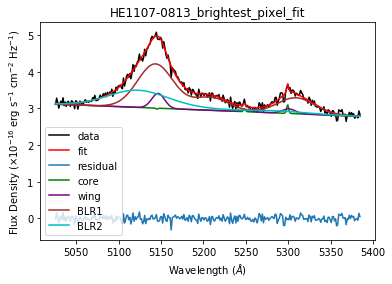

0.03391496424392315 0.08501880275407814


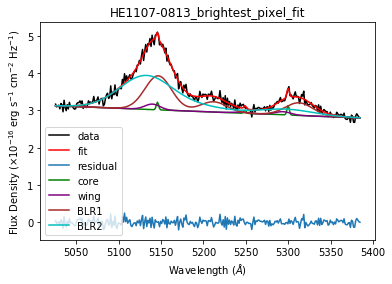

-0.09459783227019347 0.0404217322859477


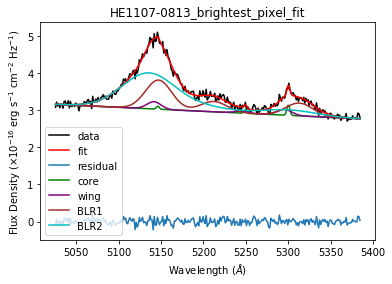

0.06903542490201708 0.0943289382996273


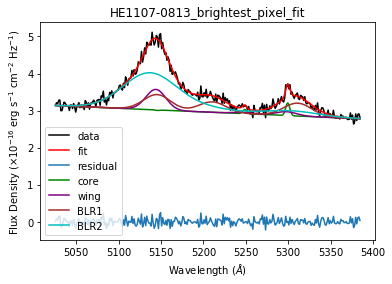

-0.12552234716057153 0.021934543437508225


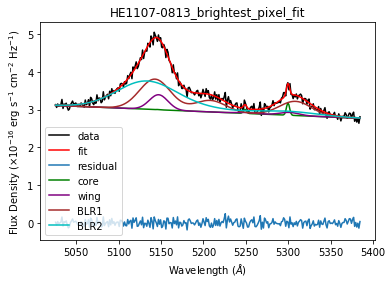

0.19015226905954297 0.1634182209047106


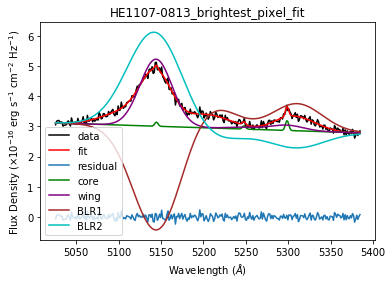

0.08120506045501141 0.06048796531809675


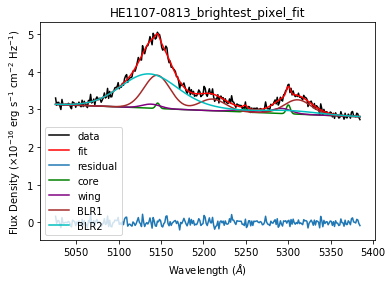

0.018464271766669427 0.006462221383157107


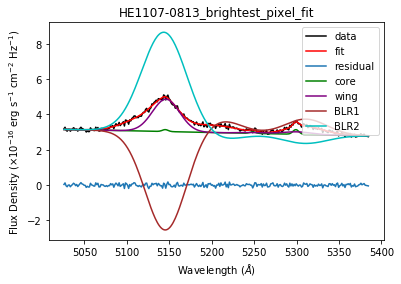

-0.10101020223873025 -0.07902629328694388


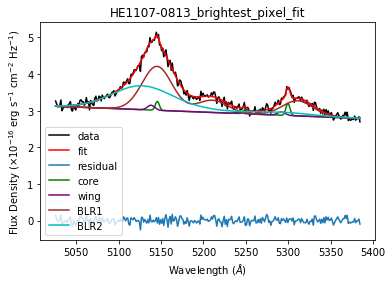

0.20300504145696063 0.1036579090112335


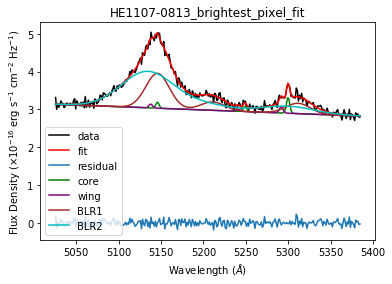

-0.09336821091211078 0.009175701564710259


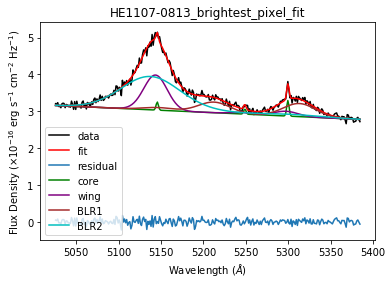

-0.0236021379663649 0.14150425568762248


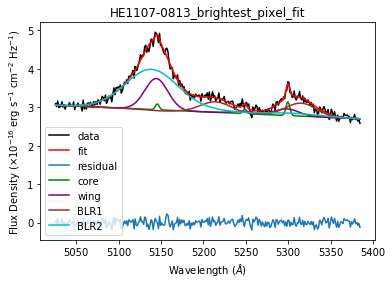

-0.1269183261860496 -0.1204781264225101


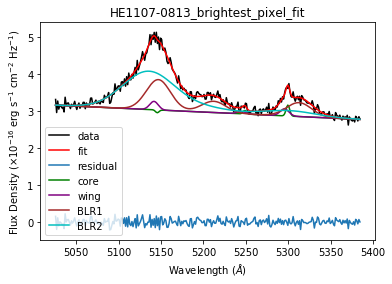

-0.05982095101123264 0.15980494388472888


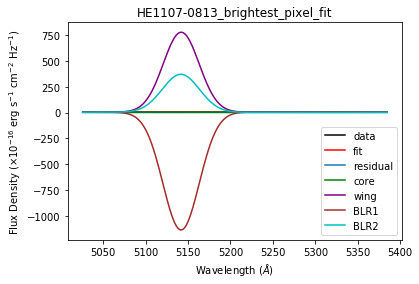

0.1407800907466159 -0.37850512489125343


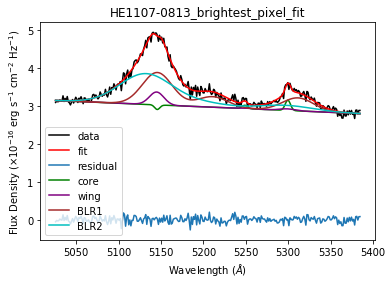

0.5763139935385757 0.2928071765706477


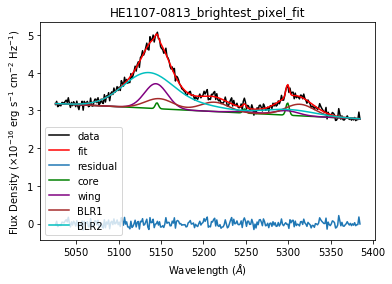

0.06910735790122757 0.006364833494587607


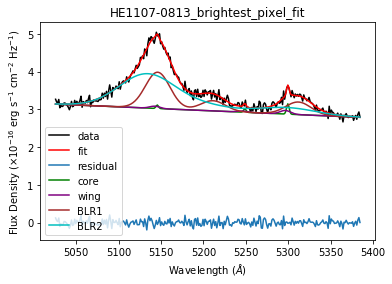

0.04150672420190826 0.07502331268216267


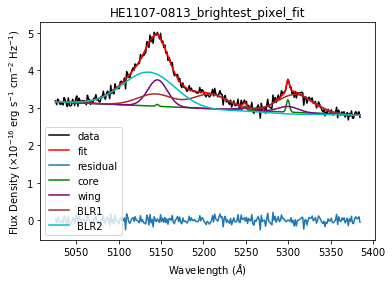

0.07512080488013684 0.025927466628533402


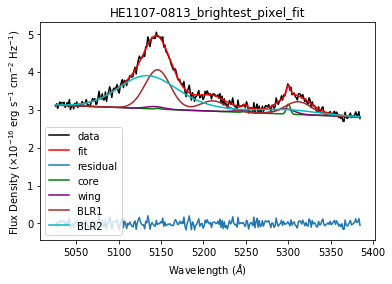

-0.14251884303777285 0.1478395540597992


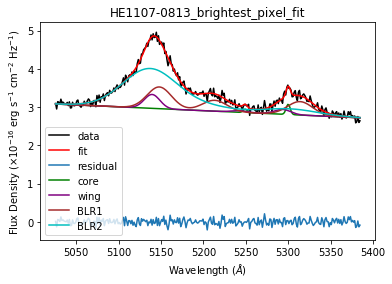

0.14119528125563896 -0.03539198506275465


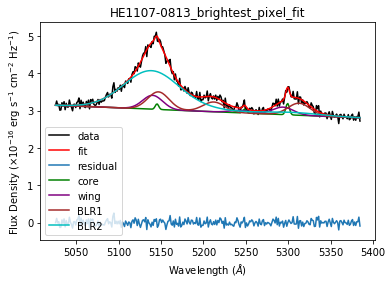

0.012712130971054059 0.07716167878883073


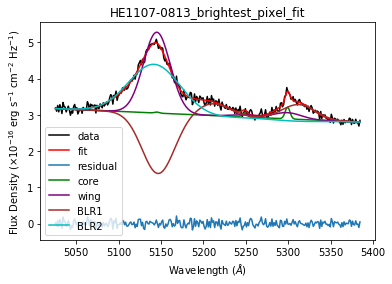

-0.0951196182881704 0.044124771970493804


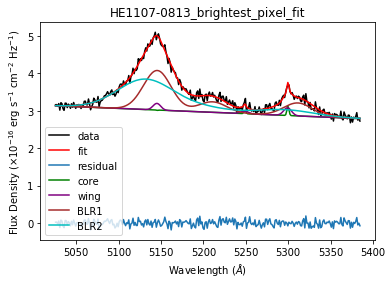

-0.03534246178702283 -0.12240070791334201


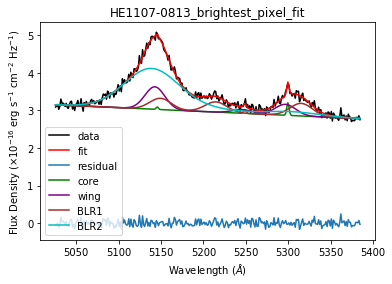

-0.10776562727493921 0.13675149730603842


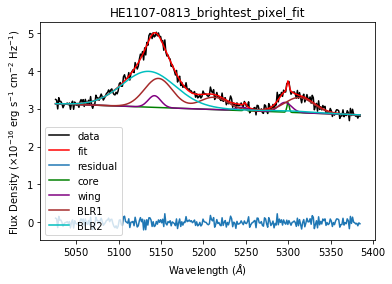

-0.07240055877614537 0.10799696626324096


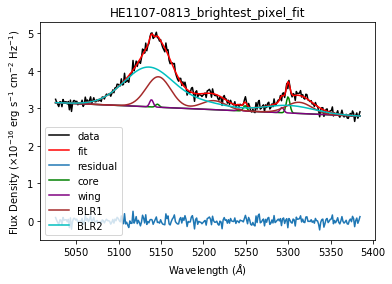

-0.14981603876232708 -0.037533696895539315


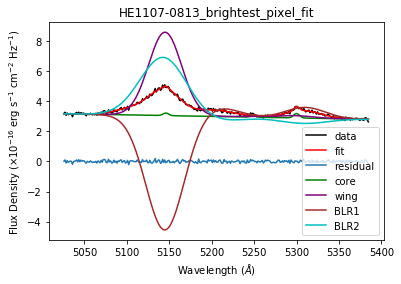

-0.16651099758633503 0.261176248841803


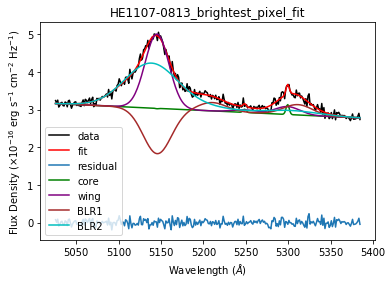

-0.2161325245893675 -0.07487307170112256


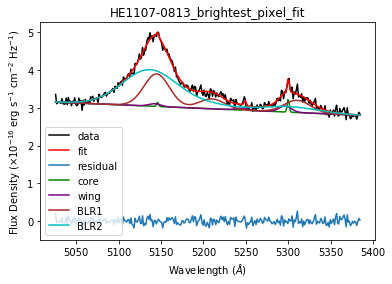

0.20891455265967185 0.014593634284151058


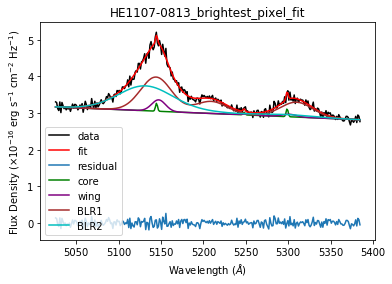

0.08671255760653906 -0.2514808298447626


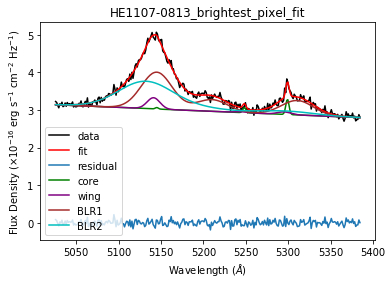

-0.2119486668582411 -0.2166847776064751


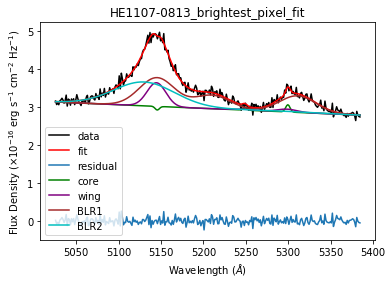

-0.05837851531147198 0.2611207037326615


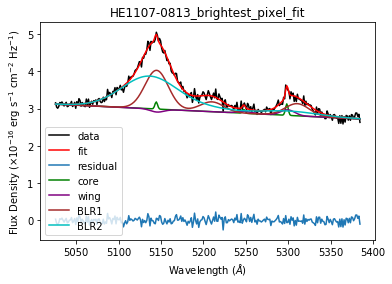

0.053403959976192183 -0.21836222982959708


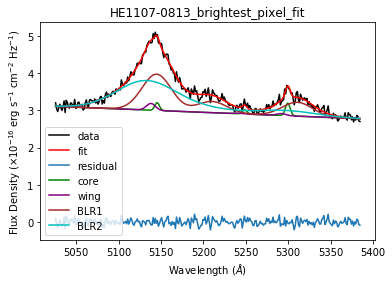

0.16884367884344265 -0.4453996144120387


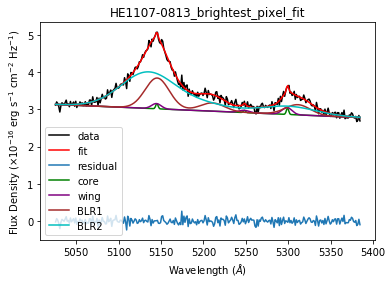

0.18452919795119094 -0.03601313496853287


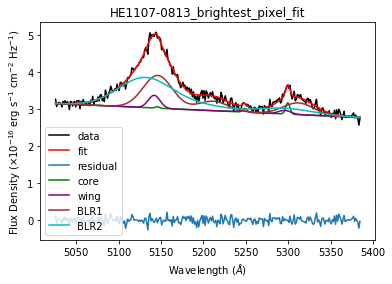

0.07630683198993893 -0.12249010554303297


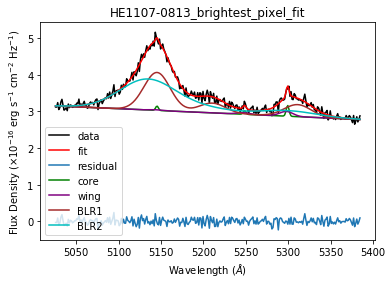

-0.011266767179928472 0.1357361505868493


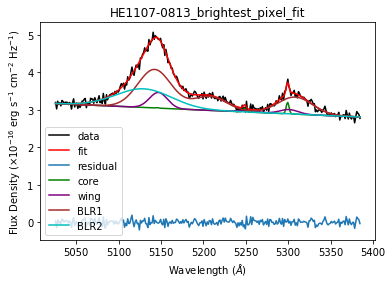

0.2336068109996443 0.2354214527245695


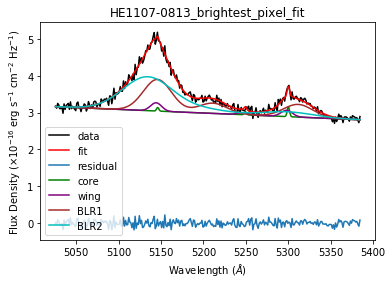

0.050666082862740325 -0.09816138881901715


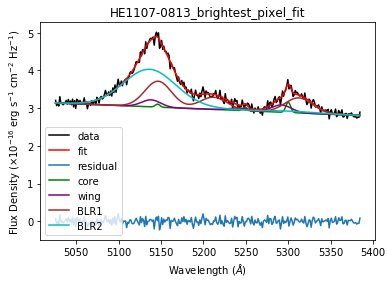

0.1472831933815355 -0.0456299127395452


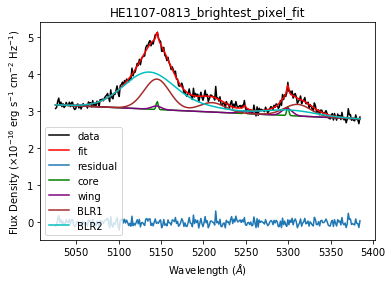

-0.05238525057521315 -0.22390075432907253


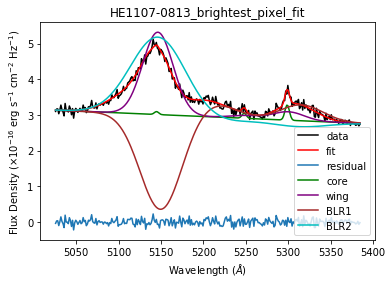

-0.013696433802256713 0.055436226126463595


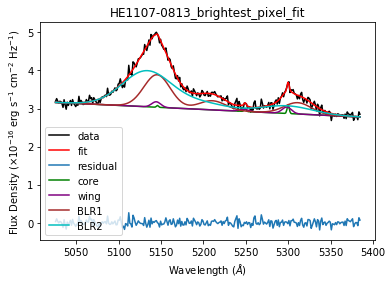

0.031081021541068843 -0.06374013499440956


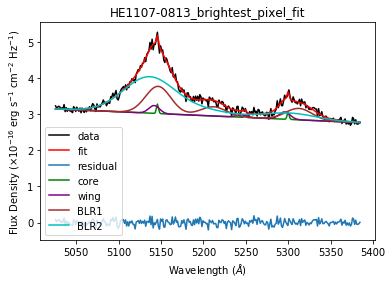

0.06282810456215149 -0.10460130457236438


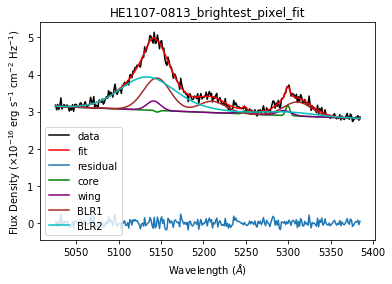

-0.05601718303702263 -0.23193114075994536


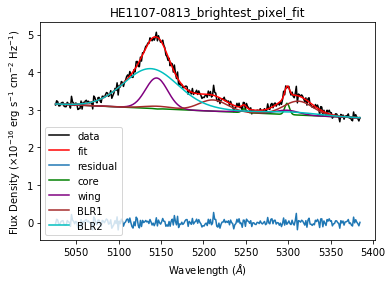

0.06508544283011286 -0.0860540338054614


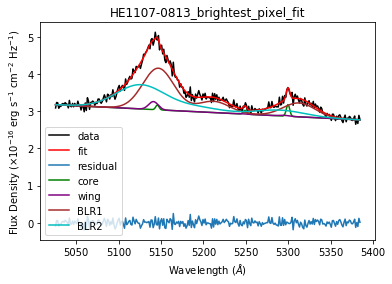

-0.16019796296000965 -0.004363739687326174


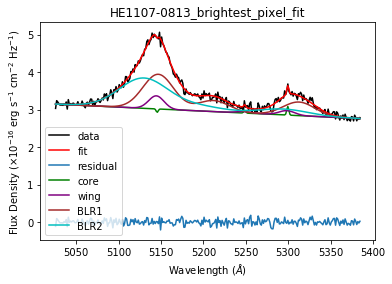

-0.3388787751986291 -0.08012667003329987


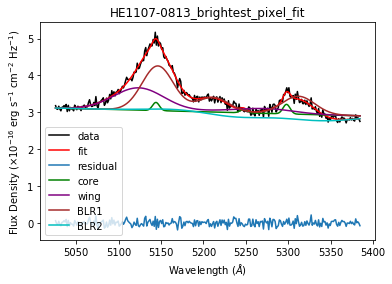

0.07498155250486782 0.18198255465387358


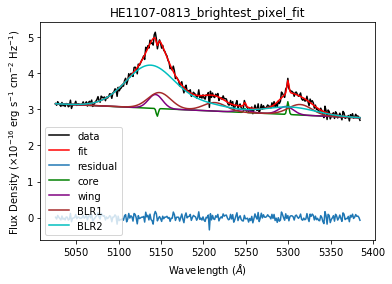

0.06629659541926625 -0.058399249879944826


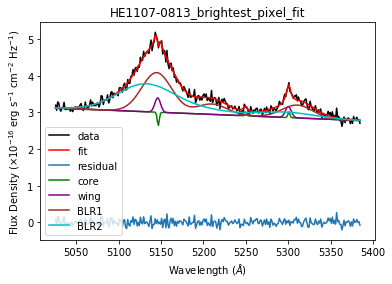

-0.09126901758713846 -0.17697148894779158


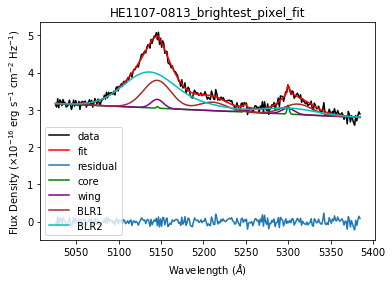

-0.06285801609706088 0.13099459209298026


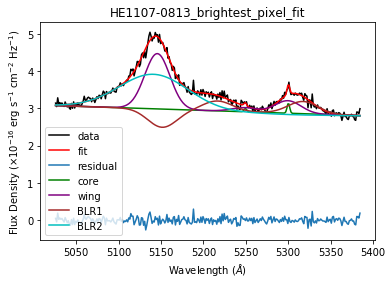

0.0063310961840796764 0.014109870059732188


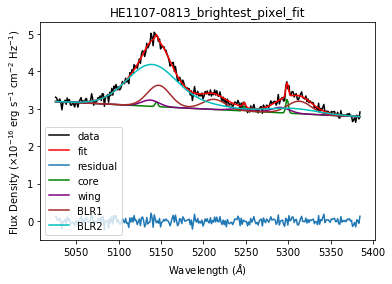

-0.002483847112856097 -0.014853079645623879


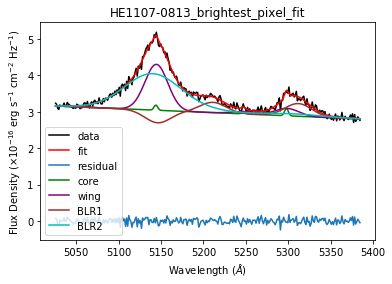

0.019166973585666547 -0.029486355277453136


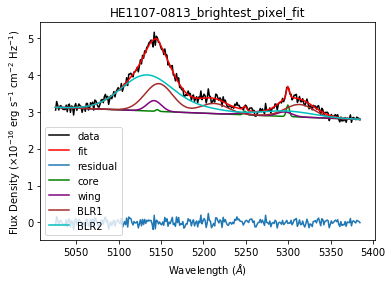

0.07596448706664649 0.07240620964168443


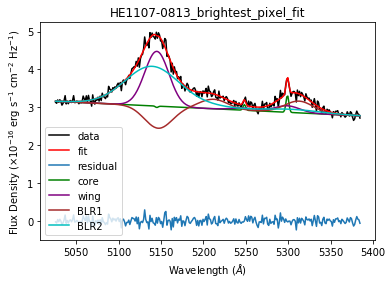

-0.006767186053589391 0.027410927200327784


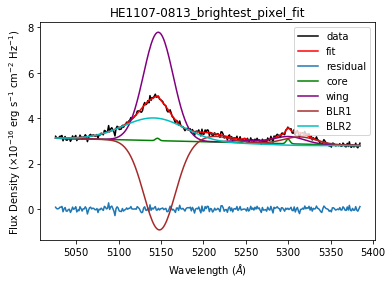

0.0536837039499396 0.008286380206692812


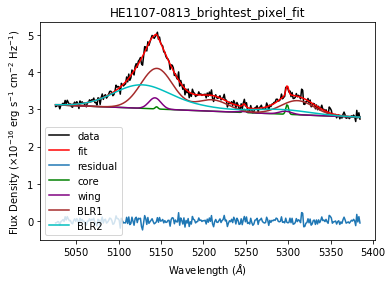

0.14372585529085757 -0.06972436134908655


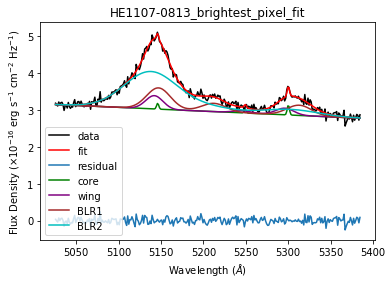

-0.033884790951313803 0.11925703440764135


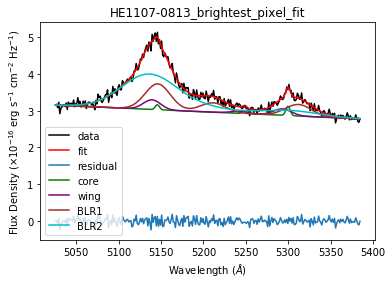

-0.10177894001001597 -0.07103159429136774


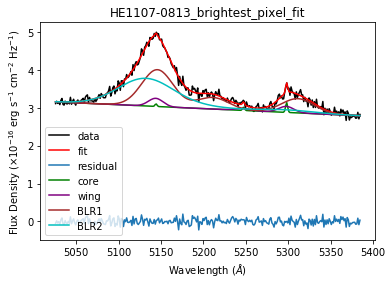

0.07104995892651811 0.10076143109581448


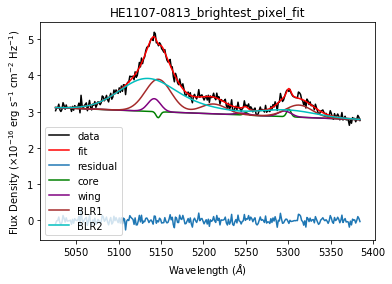

0.29586354774128143 0.09140387473644473


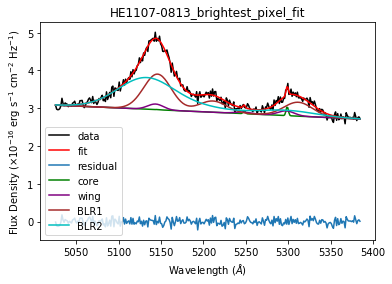

-0.06284532504813711 0.14950891598862182


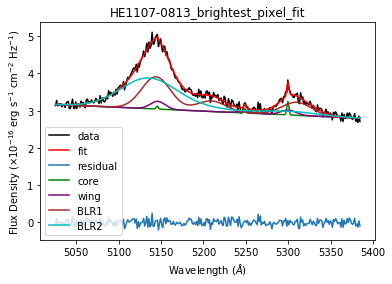

-0.16078997739244638 0.07087166412008283


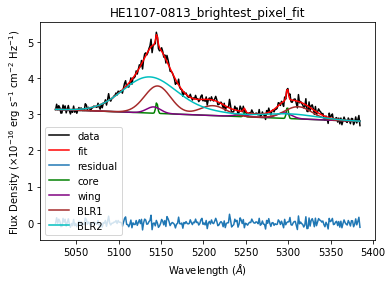

0.07843954699487021 -0.08073729856999101


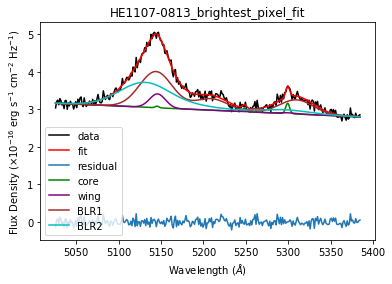

-0.32455218112222717 0.3722936648308659


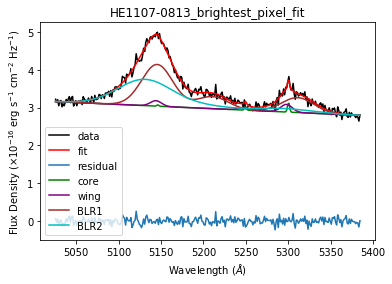

-0.001836594599525121 -0.09405276829594378


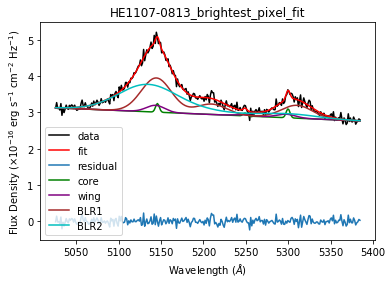

0.13634642825376098 -0.05636722604973787


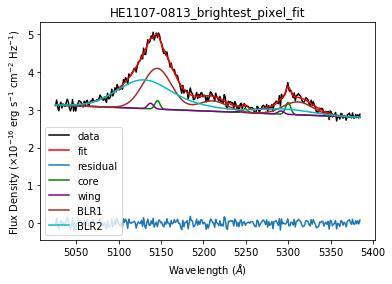

0.30165015010524776 -0.0843702917198792


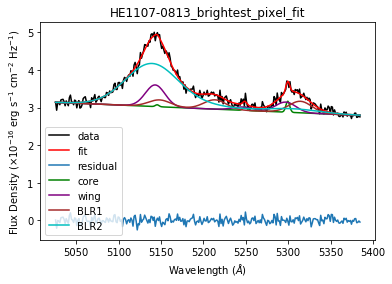

-0.02798191643817116 0.15824943843570516


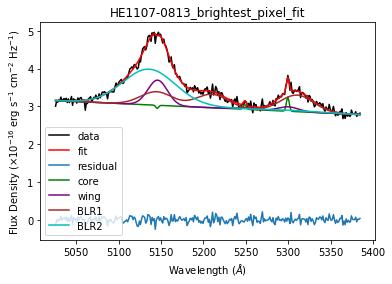

-0.010479582831427692 0.07158736859788029


In [6]:
z = {"HE1107-0813":0.058}

objs = z.keys()

broad2= {'HE1107-0813':True}

p_init= {'HE1107-0813':[3.99486547e-02,2.61496716e-01,1.75441648e+04,8.62933367e+01,
                        2.16079135e-01,1.28166775e-01,1.73852413e+04,4.85119513e+02,
                        8.68341130e-01,3.46444173e-01,1.75621524e+04,1.00209675e+03,
                        8.66721689e-01,1.29457074e-01,1.68106602e+04,1.91890818e+03,
                       -9.92976146e-01,8.13740005e+00]}
    

for obj in objs:
    print ('%s'%(obj))
    destination_path_cube='/home/mainak/Downloads/Outflow_paper1/MUSE'
    hdu = fits.open('%s/%s/Systematic Error/%s_cord_table.fits'%(destination_path_cube,obj,obj))
    central_tab = hdu[1].data
    number_of_entry = central_tab.field('No_iteration')
    hdu.close()
    (mini_cube,mini_err,mini_wave,mini_header) = loadCube('%s/%s/%s.3_arcsec_minicube.fits'%(destination_path_cube,obj,obj))    
    box_size = np.shape(mini_cube)[1]  
    y, x = np.mgrid[:box_size, :box_size]
    xy=(x,y)
    for i in range(len(number_of_entry)):
        x1 = int(central_tab.field('x_cor')[i])
        y1 = int(central_tab.field('y_cor')[i])
        algorithm_script(obj,z[obj],broad2[obj],p_init[obj],x1,y1) 
        
    input_filename1='./*moffatcentertab_%s.fits'%(obj)
    input_filename2='./*fluxmap_%s.fits'%(obj)
    input_filename3='./*fluxerrormap_%s.fits'%(obj)

    output_filename='%s_syst_table_new.fits'%(obj)

    dir_name = '%s/%s/Systematic Error'%(destination_path_cube,obj)   
    os.chdir(dir_name)
    infiles1 = sorted(glob.glob(input_filename1)) # './*source.fits'
    infiles2 = sorted(glob.glob(input_filename2)) # './*source.fits'
    infiles3 = sorted(glob.glob(input_filename3)) # './*source.fits'

    tabledict = {}
    
    for i, file in enumerate(infiles1):
        hdulist = fits.open(file)
        bintab = hdulist[1].data
        table = Table(bintab)
        name = table['Hb_x'][0]  
        tabledict[name] = table

    tab = vstack(list(tabledict.values()))
    df = tab.to_pandas()
    df = df.sort_values(by='Hb_x', ascending=True)
    dtab = Table.from_pandas(df)
    dtab.write(output_filename, format='fits', overwrite=True)
    for i, file in enumerate(infiles1):
         os.remove(file)
    for i, file in enumerate(infiles2):
         os.remove(file)
    for i, file in enumerate(infiles3):
         os.remove(file)


In [ ]:
z = {"HE0021-1810":0.05352,"HE0021-1819":0.053197,"HE0040-1105":0.041692,"HE0108-4743":0.02392,"HE0114-0015":0.04560
    ,"HE0119-0118":0.054341,"HE0212-0059":0.026385,"HE0224-2834":0.059800,"HE0227-0913":0.016451,"HE0232-0900":0.043143
    ,"HE0253-1641":0.031588,"HE0345+0056":0.031,"HE0351+0240":0.036,"HE0412-0803":0.038160,"HE0429-0247":0.042009
    ,"HE0433-1028":0.035550,"HE0853+0102":0.052,"HE0934+0119":0.050338,"HE1011-0403":0.058314,"HE1017-0305":0.049986
    ,"HE1029-1831":0.040261,"HE1107-0813":0.058,"HE1108-2813":0.024013,"HE1126-0407":0.061960,"HE1237-0504":0.009
    ,"HE1248-1356":0.01465,"HE1330-1013":0.022145,"HE1353-1917":0.035021,"HE1417-0909":0.044,"HE2128-0221":0.05248
    ,"HE2211-3903":0.039714,"HE2222-0026":0.059114,"HE2233+0124":0.056482,"HE2302-0857":0.046860}

objs = z.keys()

broad2= {'HE0021-1810':False,'HE0021-1819':False,'HE0040-1105':False,'HE0108-4743':True,'HE0114-0015':False
        ,'HE0119-0118':True,'HE0212-0059':True,'HE0224-2834':False,'HE0227-0913':True,'HE0232-0900':False
        ,'HE0253-1641':True,'HE0345+0056':True,'HE0351+0240':True,'HE0412-0803':False,'HE0429-0247':True
        ,'HE0433-1028':True,'HE0853+0102':True,'HE0934+0119':True,'HE1011-0403':True,'HE1017-0305':False
        ,'HE1029-1831':True,'HE1107-0813':True,'HE1108-2813':False,'HE1126-0407':True,'HE1237-0504':False
        ,'HE1248-1356':False,'HE1330-1013':True,'HE1353-1917':True,'HE1417-0909':False,'HE2128-0221':False
        ,'HE2211-3903':False,'HE2222-0026':True,'HE2233+0124':True,'HE2302-0857':True}

p_init= {'HE0021-1810':[0.1,1.5248,16056,50.0,1.0,3.0,15956,100.0,1.0,1.0,16056,1000.0,0,0,16056,1000.0,-0.001,2.0]
        ,'HE0021-1819':[1,12.5,15959,50.0,3,3,15759,200.0,2,2,15959,1000.0,0,0,15959,1000.0,-0.001,0.1]
        ,'HE0040-1105':[1.139,1.5,12507.0,50.0,1.0,3.0,12307.0,200.0,1.0,1.0,12507,1000.0,0,0,12507,1000.0,-0.001,2.0]
        ,'HE0108-4743':[1.7,4.5,7160.0,40.0,0.12,2.5,7100.0,120.0,1.0,1.0,6960,1300.0,1.0,1.0,7190,430.0,-0.001,2.0]
        ,'HE0114-0015':[0.1,1.5,13680,50.0,1.0,3.0,13480,100.0,1.0,1.0,13680,1000.0,0,0,13680,1000.0,-0.001,0.3]
        ,'HE0119-0118':[1,12.5,16302,50.0,3,3,16102,100.0,2,2,16302,1000.0,1,1,16302,2500.0,-0.001,0.1]
        ,'HE0212-0059':[0.1,1.0,7930,170.0,0.1,0.1,7630,450.0,1.0,1.0,7620,4000.0,0.1,0.1,4650,1090.0,-0.001,2.0]
        ,'HE0224-2834':[0.2,2.5,17940,50.0,0.3,0.3,17640,200.0,0.1,0.1,17940,1500.0,0,0,17940,1500.0,-0.001,0.1]
        ,'HE0227-0913':[3,6,4785,150,2,7,4385,300.0,7,1.8,4935,400.0,3,0.5,4735,1500.0,-0.3,4.7]
        ,'HE0232-0900':[2,40,12942,50.0,5,5,12742,100.0,5,1,12942,1000.0,0,0,12942,1000.0,-0.001,0.1]                                     
        ,'HE0253-1641':[2,10,9476,110.0,1,6,9176,370.0,1,1,9476,1500.0,0.5,0.5,9476,550.0,-0.001,0.5]
        ,'HE0345+0056':[0.5,20,9300,150,5,10,9000,300,9,1.8,9300,400,30,2.5,9300,1500,0.3,7.1]
        ,'HE0351+0240':[2.2,37,10600,77,1.1,1.5,10618,277,1.5,0.07,11580,320,3,0.35,10650,1344,-0.3,3]                                                    
        ,'HE0412-0803':[1.139,1.5,11448,50.0,0.1,0.3,11248,100.0,0.1,0.1,11448,1000.0,0,0,11448,1000.0,-0.001,0.5]
        ,'HE0429-0247':[0.9,8.5,12600,90,0.2,2.0,12500,220,1.7,0.07,12600,450,1.3,0.2,12600,1600,-0.5,4.0]
        ,'HE0433-1028':[0.9,4.0,10665.0,100.0,1.0,1.0,10465.0,300.0,1.0,1.0,10665,800.0,0.1,0.1,10665,1500.0,-0.1,1.0]
        ,'HE0853+0102':[0.1,0.9,15700,110.0,0.02,0.3,15670,320.0,0.1,0.1,15900,1640.0,0.0,0.0,17250,810.0,-0.001,0.1]
        ,'HE0934+0119':[0.6,1.9,15101,100.0,0.2,0.2,14901,400.0,0.3,0.1,15101,1000.0,0.1,0.1,15101,1000.0,0.001,0.7]
        ,'HE1011-0403':[0.1,0.6,17494,60.0,0.2,0.2,17244,200.0,0.3,0.1,17494,1500.0,0.1,0.1,17494,1500.0,0.001,0.7]
        ,'HE1017-0305':[0.1,1.5,14695,50,0.08,0.4,14595,200,0.7,0.09,14695,2000,0,0,0,0,-0.3,2.0]
        ,'HE1029-1831':[0.6,1.3,12114,50.0,0.2,0.2,11978,200.0,0.3,0.1,12114,1000.0,0.2,0.2,12114,1000.0,-0.001,0.2]
        ,'HE1107-0813':[0.04,0.3,17500,100,0.2,0.13,17400,480,0.9,0.13,17500,1000,0.9,0.08,16800,2000,-0.9,8]
        ,'HE1108-2813':[1.139,1.5,7200.0,50.0,1.0,3.0,7000.0,100.0,1.0,1.0,7200,1000.0,0,0,7200,1000.0,-0.001,2.0]
        ,'HE1126-0407':[1,13,18200,100,2.5,3,18000,300,10,1.3,18200,800,7,1.8,18200,1600,-0.9,15]
        ,'HE1237-0504':[1,10,2700.0,80.0,0.5,2,2700.0,200,2,0.5,2700.0,1500.0,0,0,2700.0,1000.0,-0.001,0.002]
        ,'HE1248-1356':[0.1,1.5,4395.0,50.0,1.0,3.0,4195.0,100.0,1.0,1.0,4395,1000.0,0,0,0,0.0,-0.001,2.0]
        ,'HE1330-1013':[0.15,0.6,6643,90,0.05,0.15,6543,200,0.12,0.04,6643,1500,0.3,0.04,6643,500,-0.02,0.3]
        ,'HE1353-1917':[0.07,0.7,10490.0,80.0,0.39,0.05,10306.0,490.0,0.1,0.02,8600.0,1500.0,0.14,0.02,12326.0,1500.0,-0.001,0.002]
        ,'HE1417-0909':[1,12.5,13200,50.0,3,3,13000,100.0,2,2,13200,1000.0,0,0,13200,1000.0,-0.001,0.1]
        ,'HE2128-0221':[0.1,1.5,15744,50.0,1.0,3.0,15544,100.0,1.0,1.0,15744,1000.0,0,0,15744,1000.0,-0.001,2.0]
        ,'HE2211-3903':[0.6,2.4,11914,50.0,0.1,0.1,11714,100.0,0.1,0.1,11914,200.0,0,0,11914,100.0,-0.001,0.2]
        ,'HE2222-0026':[0.08,0.4,17400.0,140.0,0.04,0.05,17150.0,300.0,0.4,0.1,18500,650.0,0.02,0.01,17460,1750.0,-0.001,0.002]
        ,'HE2233+0124':[0.1,1.2,16944.0,100.0,1.0,3.0,17044.0,300.0,1.0,1.0,16944,1200.0,1.0,1.0,16944,4000.0,-0.001,2.0]
        ,'HE2302-0857':[1,8,14058,200,0.1,2,14258,300,1,0.1,14058,1000,0.1,0.1,14058,1000,0.01,0.2]}
    

for obj in objs:
    print ('%s'%(obj))
    destination_path_cube='/home/mainak/Downloads/Outflow_paper1/MUSE'
    hdu = fits.open('%s/%s/Systematic Error/%s_cord_table.fits'%(destination_path_cube,obj,obj))
    central_tab = hdu[1].data
    number_of_entry = central_tab.field('No_iteration')
    hdu.close()
    (mini_cube,mini_err,mini_wave,mini_header) = loadCube('%s/%s/%s.3_arcsec_minicube.fits'%(destination_path_cube,obj,obj))    
    box_size = np.shape(mini_cube)[1]  
    y, x = np.mgrid[:box_size, :box_size]
    xy=(x,y)
    for i in range(len(number_of_entry)):
        x1 = int(central_tab.field('x_cor')[i])
        y1 = int(central_tab.field('y_cor')[i])
        algorithm_script(obj,z[obj],broad2[obj],p_init[obj],x1,y1) 
        
    input_filename1='./*moffatcentertab_%s.fits'%(obj)
    input_filename2='./*fluxmap_%s.fits'%(obj)
    input_filename3='./*fluxerrormap_%s.fits'%(obj)

    output_filename='%s_syst_table_new.fits'%(obj)

    dir_name = '%s/%s/Systematic Error'%(destination_path_cube,obj)   
    os.chdir(dir_name)
    infiles1 = sorted(glob.glob(input_filename1)) # './*source.fits'
    infiles2 = sorted(glob.glob(input_filename2)) # './*source.fits'
    infiles3 = sorted(glob.glob(input_filename3)) # './*source.fits'

    tabledict = {}
    
    for i, file in enumerate(infiles1):
        hdulist = fits.open(file)
        bintab = hdulist[1].data
        table = Table(bintab)
        name = table['Hb_x'][0]  
        tabledict[name] = table

    tab = vstack(list(tabledict.values()))
    df = tab.to_pandas()
    df = df.sort_values(by='Hb_x', ascending=True)
    dtab = Table.from_pandas(df)
    dtab.write(output_filename, format='fits', overwrite=True)
    for i, file in enumerate(infiles1):
         os.remove(file)
    for i, file in enumerate(infiles2):
         os.remove(file)
    for i, file in enumerate(infiles3):
         os.remove(file)
